# WISDM Smartphone and Smartwatch Activity

DS169 - Internet of Things | 20 January 2024 <br>
Divina, Lorenzo David C. | Santos, Alwin Denz S.A. | Moreno, Elijah

For this activity, refer to following link below regarding the dataset to be used:

https://archive.ics.uci.edu/dataset/507/wisdm+smartphone+and+smartwatch+activity+and+biometrics+dataset

Submit an iPyNotebook containing the data processing, feature engineering (if applicable), and an EDA of the given dataset. Provide key highlights such as notable metric value ranges (gyroscope, accelerometer, etc.) in performing a given activity, as well as visualizations to support the observations.

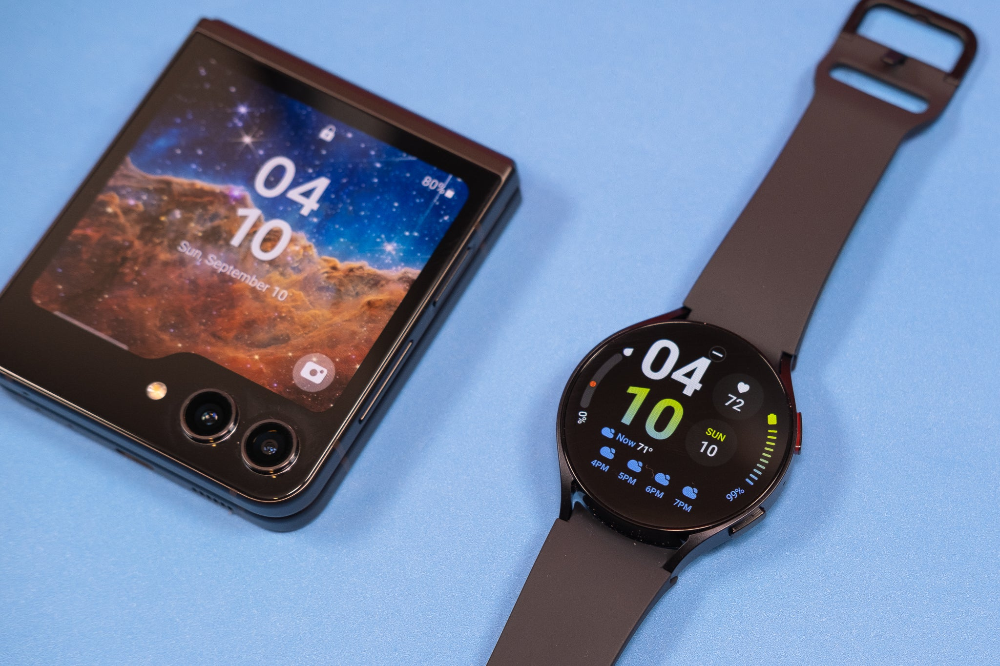

***

## Data Collection

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
activity_codes_mapping = {'A': 'walking',
                          'B': 'jogging',
                          'C': 'stairs',
                          'D': 'sitting',
                          'E': 'standing'}

In [3]:
import os
import pandas as pd

def read_raw(root_folder):
    filtered_data = {}

    subject_range = range(1600, 1651)
    activity_codes = ['A', 'B', 'C', 'D', 'E']

    for subject_id, activity_code, sensor_type, device_type in [(s, a, st, dt) for s in subject_range for a in activity_codes for st in ['accel', 'gyro'] for dt in ['phone', 'watch']]:
        folder_path = os.path.join(root_folder, device_type, sensor_type)
        file_name = f"data_{subject_id}_{sensor_type}_{device_type}"
        file_path = os.path.join(folder_path, f"{file_name}.txt")

        if os.path.exists(file_path):
            data = pd.read_csv(file_path, header=None, names=['SubjectID', 'Activity Code', 'Timestamp', 'X', 'Y', 'Z'], sep=',')
            data['Z'] = data['Z'].str.strip(';')
            data['Z'] = pd.to_numeric(data['Z'])
            data = data[data['Activity Code'] == activity_code]
            activity_codes_mapping = {'A': 'Walking', 'B': 'Jogging', 'C': 'Stairs', 'D': 'Sitting', 'E': 'Standing'}
            data['Activity'] = data['Activity Code'].map(activity_codes_mapping)
            data = data[['SubjectID', 'Activity Code', 'Activity', 'Timestamp', 'X', 'Y', 'Z']]
            
            key = f"{device_type}_{sensor_type}"
            filtered_data.setdefault(key, pd.DataFrame())
            filtered_data[key] = pd.concat([filtered_data[key], data])

    return filtered_data

root_folder = r"D:\ADSAS\BS Data Science 001\3RD YEAR\002_2ND TERM\DS169 - INTERNET OF THINGS\wisdm+smartphone+and+smartwatch+activity+and+biometrics+dataset\wisdm-dataset\raw"
result = read_raw(root_folder)

phone_accel_data, watch_accel_data, phone_gyro_data, watch_gyro_data = result.values()

In [4]:
def show_accel_per_activity(df, act, dev, interval_in_sec=None):
    df1 = df.loc[df['Activity'] == act].copy()
    df1.reset_index(drop=True, inplace=True)

    df1['duration'] = (df1['Timestamp'] - df1['Timestamp'].iloc[0]) / 1e9 

    colors = ['#CD6155', '#F7DC6F', '#85C1E9']
    if interval_in_sec is None:
        ax = df1[:].plot(kind='line', x='duration', y=['X', 'Y', 'Z'], figsize=(12, 6), color=colors, linewidth=2, grid=False)  
    else:
        ax = df1[:int(interval_in_sec * 20)].plot(kind='line', x='duration', y=['X', 'Y', 'Z'], figsize=(12, 6), color=colors, linewidth=2, grid=False)  

    ax.set_xlabel('Duration (sec)', fontsize=12)
    ax.set_ylabel('Acceleration (m/sec^2)', fontsize=12)
    ax.set_title(f'{act}')
    ax.yaxis.grid(True, alpha = 0.3)

    plt.show()

In [5]:
def show_angvelocity_per_activity(df, act, dev, interval_in_sec=None):
    df1 = df.loc[df['Activity'] == act].copy()
    df1.reset_index(drop=True, inplace=True)

    df1['duration'] = (df1['Timestamp'] - df1['Timestamp'].iloc[0]) / 1e9 

    colors = ['#CD6155', '#F7DC6F', '#85C1E9']
    if interval_in_sec is None:
        ax = df1[:].plot(kind='line', x='duration', y=['X', 'Y', 'Z'], figsize=(12, 6), color=colors, linewidth=2, grid=False)  
    else:
        ax = df1[:int(interval_in_sec * 20)].plot(kind='line', x='duration', y=['X', 'Y', 'Z'], figsize=(12, 6), color=colors, linewidth=2, grid=False)  

    ax.set_xlabel('Duration (sec)', fontsize=12)
    ax.set_ylabel('Angular Velocity (rad/sec)', fontsize=12)
    ax.set_title(f'{act}')
    ax.yaxis.grid(True, alpha = 0.3)

    plt.show()


## Raw Data

### Phone Acceleration Data

In [6]:
phone_accel_data.head(10)

,SubjectID,Activity Code,Activity,Timestamp,X,Y,Z
0,1600,A,Walking,252207666810782,-0.364761,8.793503,1.055084
1,1600,A,Walking,252207717164786,-0.879730,9.768784,1.016998
2,1600,A,Walking,252207767518790,2.001495,11.109070,2.619156
3,1600,A,Walking,252207817872794,0.450623,12.651642,0.184555
4,1600,A,Walking,252207868226798,-2.164352,13.928436,-4.422485
5,1600,A,Walking,252207918580802,-4.332779,13.361191,-0.718872
6,1600,A,Walking,252207968934806,-0.319443,13.318359,-0.232025
7,1600,A,Walking,252208019288809,1.566452,9.515274,-0.017776
8,1600,A,Walking,252208069642813,-0.323746,5.262665,0.322342
9,1600,A,Walking,252208119996817,-1.811676,3.710510,1.373932


In [7]:
phone_accel_data.shape[0]

1338067

In [8]:
phone_accel_data['Activity Code'].value_counts().sort_index()

A    279817
B    268409
C    255645
D    264592
E    269604
Name: Activity Code, dtype: int64

### Phone Gyroscope Data

In [9]:
phone_gyro_data.head(10)

,SubjectID,Activity Code,Activity,Timestamp,X,Y,Z
0,1600,A,Walking,252207918580802,-0.853210,0.297226,0.890182
1,1600,A,Walking,252207968934806,-0.875137,0.015472,0.162231
2,1600,A,Walking,252208019288809,-0.720169,0.388489,-0.284012
3,1600,A,Walking,252208069642813,-0.571640,1.227402,-0.241669
4,1600,A,Walking,252208119996817,-0.380493,1.202835,-0.213135
5,1600,A,Walking,252208170350821,-0.225784,0.558136,0.124481
6,1600,A,Walking,252208220704825,0.127808,0.380066,0.552887
7,1600,A,Walking,252208271058829,-0.513504,0.379852,0.332291
8,1600,A,Walking,252208321412833,0.446365,-0.510590,-0.113098
9,1600,A,Walking,252208371766837,-1.356628,-0.435287,-0.455170


In [10]:
phone_gyro_data.shape[0]

1006749

In [11]:
phone_gyro_data['Activity Code'].value_counts().sort_index()

A    203919
B    200252
C    197857
D    202370
E    202351
Name: Activity Code, dtype: int64

### Watch Acceleration Data

In [12]:
watch_accel_data.head(10)

,SubjectID,Activity Code,Activity,Timestamp,X,Y,Z
0,1600,A,Walking,90426708196641,7.091625,-0.591667,8.195502
1,1600,A,Walking,90426757696641,4.972757,-0.158317,6.696732
2,1600,A,Walking,90426807196641,3.253720,-0.191835,6.107758
3,1600,A,Walking,90426856696641,2.801216,-0.155922,5.997625
4,1600,A,Walking,90426906196641,3.770868,-1.051354,7.731027
5,1600,A,Walking,90426955696641,4.661511,0.169689,9.684695
6,1600,A,Walking,90427005196641,6.145916,0.832883,11.003901
7,1600,A,Walking,90427054696641,7.259220,-0.792780,11.485135
8,1600,A,Walking,90427104196641,7.354988,-2.535759,11.454011
9,1600,A,Walking,90427153696641,7.319075,-2.700959,11.461193


In [13]:
watch_accel_data.shape[0]

1053141

In [14]:
watch_accel_data['Activity Code'].value_counts().sort_index()

A    210495
B    205787
C    207312
D    213018
E    216529
Name: Activity Code, dtype: int64

### Watch Gyroscope Data

In [15]:
watch_gyro_data.head(10)

,SubjectID,Activity Code,Activity,Timestamp,X,Y,Z
0,1600,A,Walking,90426757696641,0.314944,-1.022277,-0.309962
1,1600,A,Walking,90426807196641,0.387382,-0.618541,-0.048972
2,1600,A,Walking,90426856696641,0.070999,-0.209480,-0.195978
3,1600,A,Walking,90426906196641,0.037975,0.254976,-0.156563
4,1600,A,Walking,90426955696641,0.073129,0.719431,-0.001035
5,1600,A,Walking,90427005196641,-0.101574,1.082686,-0.134193
6,1600,A,Walking,90427054696641,-0.677882,1.176429,-0.211957
7,1600,A,Walking,90427104196641,-0.163360,1.019835,0.303631
8,1600,A,Walking,90427153696641,0.412948,0.990008,0.994987
9,1600,A,Walking,90427203196641,0.286182,0.786543,1.180343


In [16]:
watch_gyro_data.shape[0]

949933

In [17]:
watch_gyro_data['Activity Code'].value_counts().sort_index()

A    192531
B    187833
C    180416
D    195050
E    194103
Name: Activity Code, dtype: int64

## Exploratory Data Analysis 

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_activity_frequency(df):
    users = df['SubjectID'].unique()
    activities = df['Activity'].unique()

    user_groups = [users[i:i + 11] for i in range(0, len(users), 11)]
    
    freq_colors = ['#C0392B', '#5DADE2', '#52BE80', '#F4D03F', '#DC7633']
    
    for index, group in enumerate(user_groups):
        plt.figure(figsize=(4, 2))
        
        data = df[df['SubjectID'].isin(group)]
        activity_counts = data.groupby(['SubjectID', 'Activity'])['Activity Code'].count().unstack().fillna(0)
        
        activity_counts.plot(kind='bar', stacked=False, color=freq_colors)
        
        plt.title(f'Number of samples per activities of Group {index+1}')
        plt.xlabel('User')
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        
        plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1) 
        
        plt.show()

### Phone Acceleration

<Figure size 400x200 with 0 Axes>

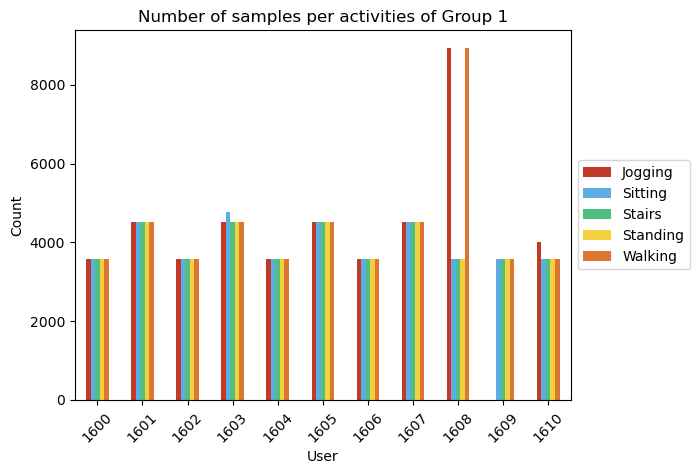

<Figure size 400x200 with 0 Axes>

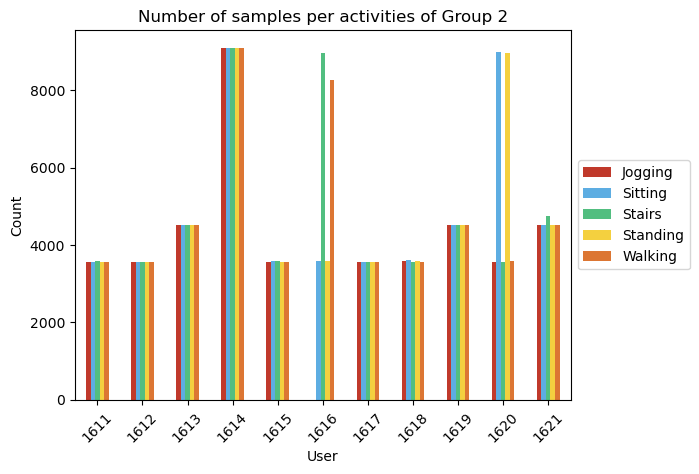

<Figure size 400x200 with 0 Axes>

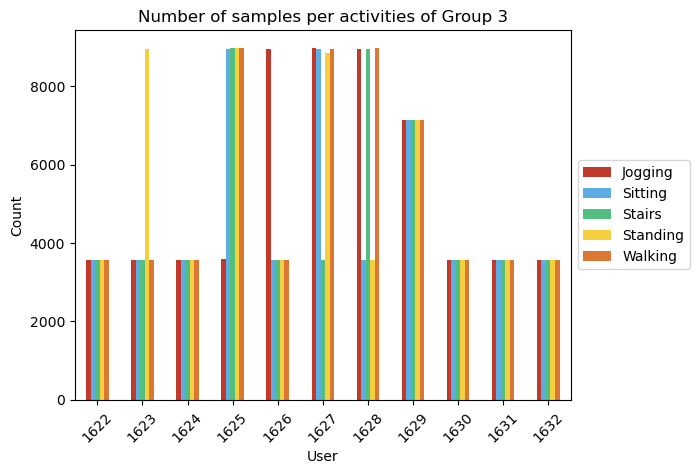

<Figure size 400x200 with 0 Axes>

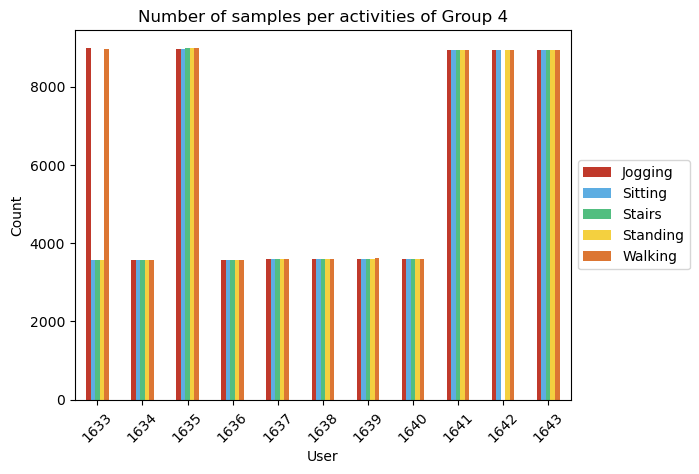

<Figure size 400x200 with 0 Axes>

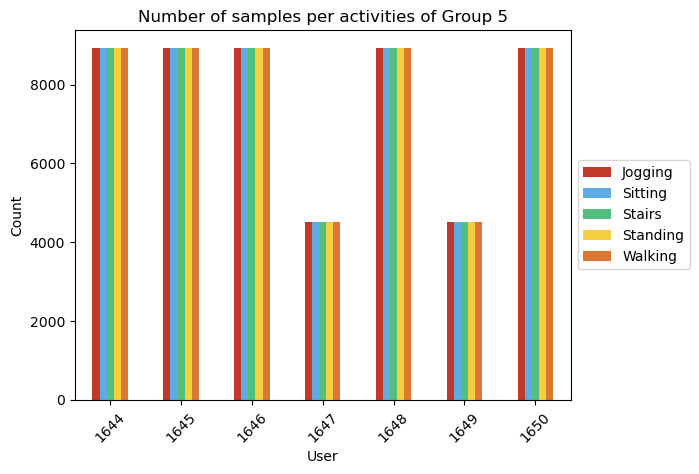

In [19]:
plot_activity_frequency(phone_accel_data)

> The graphs show the phone acceleration data. The counts vary significantly between users across the five activities: Jogging, Sitting, Stairs, Standing, and Walking. Users 1614, 1625,1635, 1641, 1643, 1644, 1645, 1646, 1648, and 1650 stand out with a notably high count (8000+) in all the activities compared to other users. 

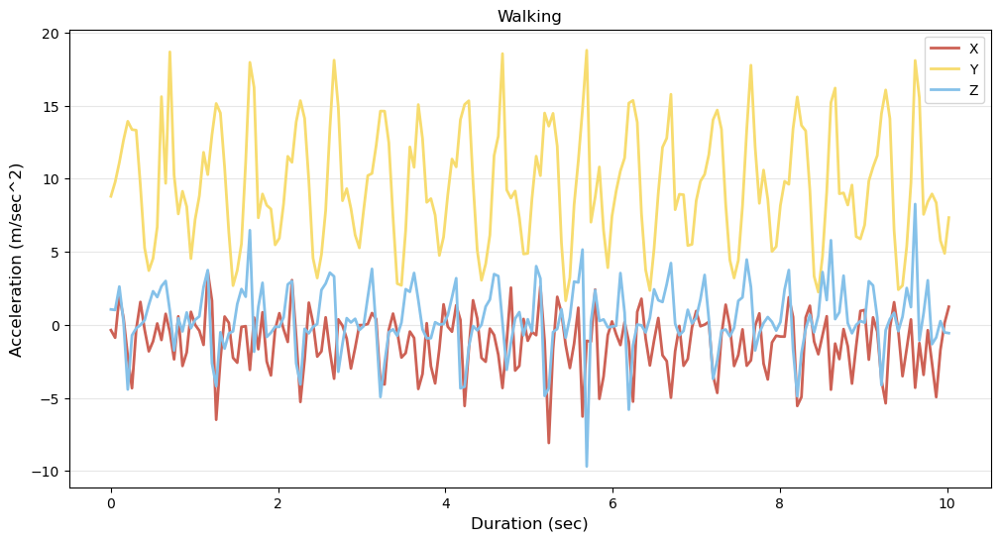

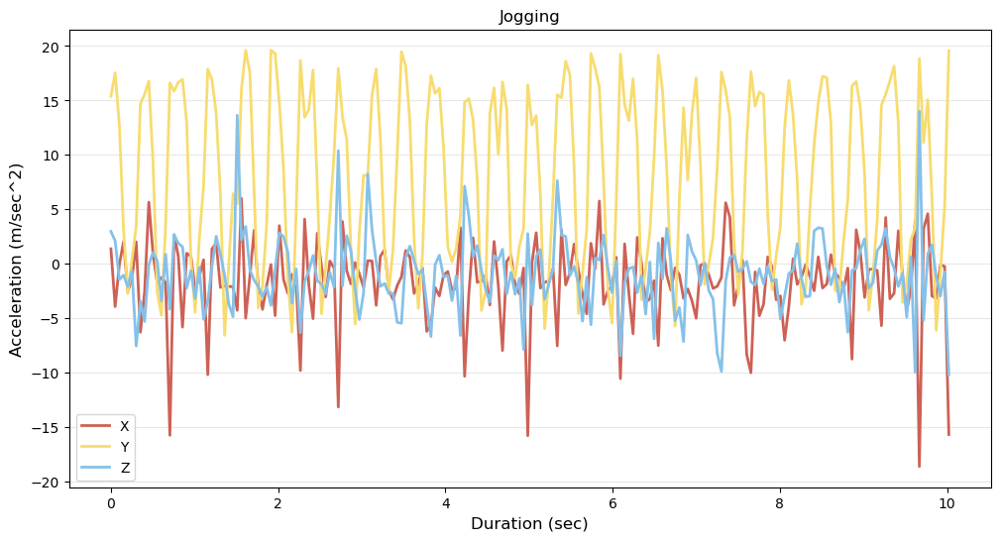

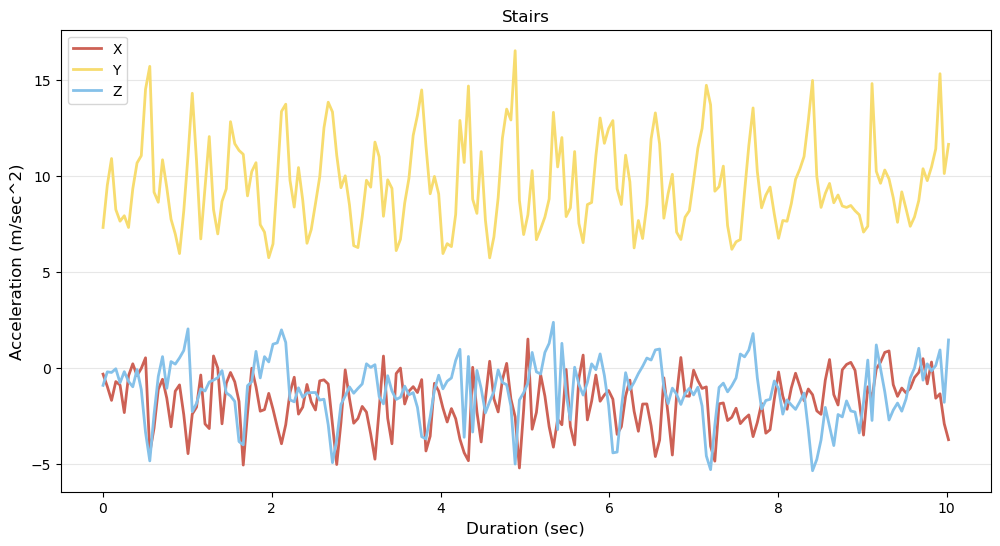

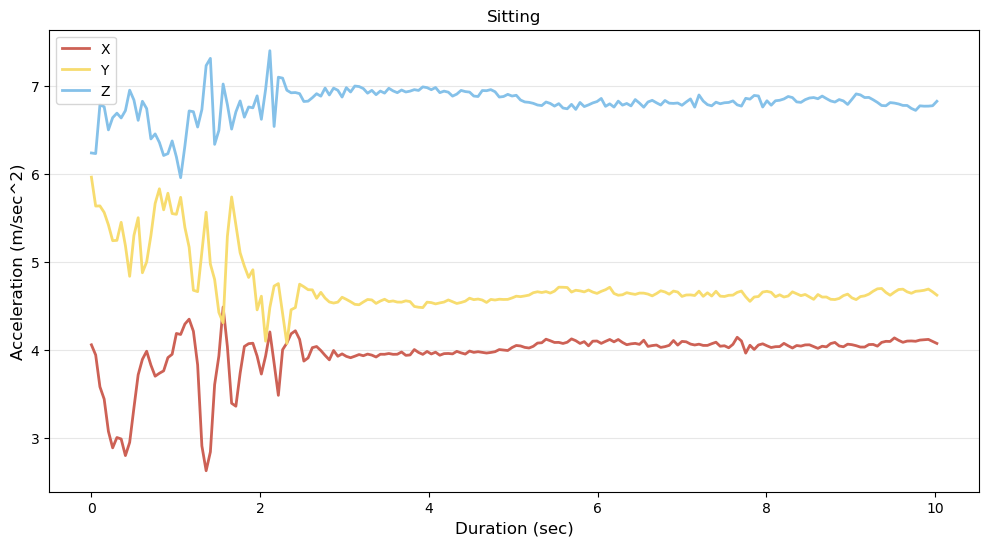

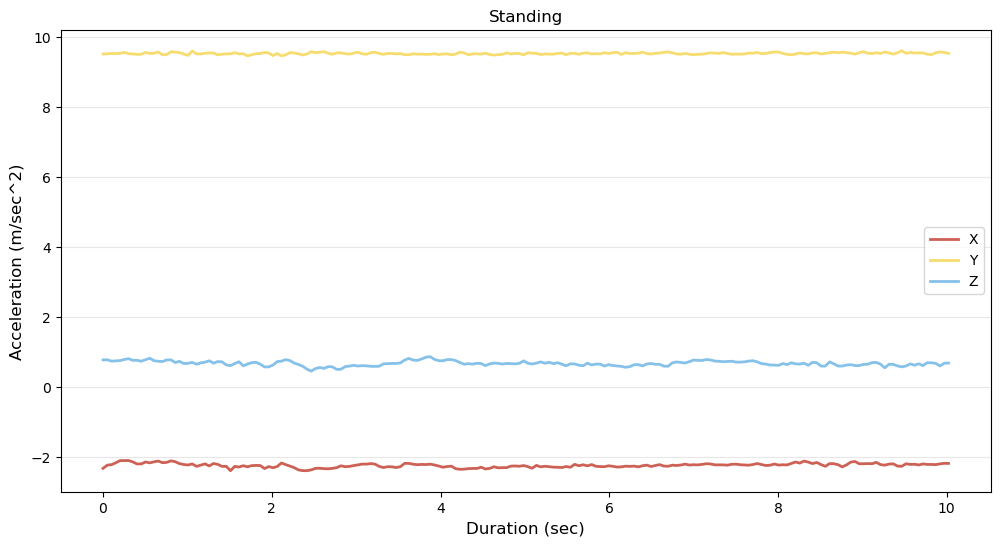

In [20]:
activities = ['Walking', 'Jogging', 'Stairs', 'Sitting', 'Standing']

for activity in activities:
    show_accel_per_activity(phone_accel_data, activity, 'Phone', 10)

### Phone Gyroscope

<Figure size 400x200 with 0 Axes>

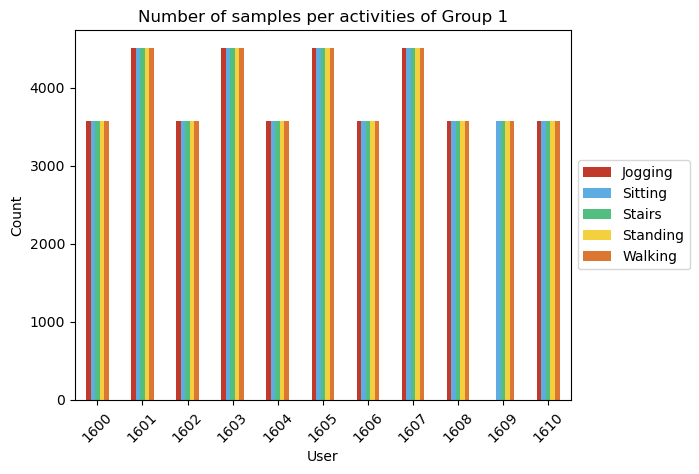

<Figure size 400x200 with 0 Axes>

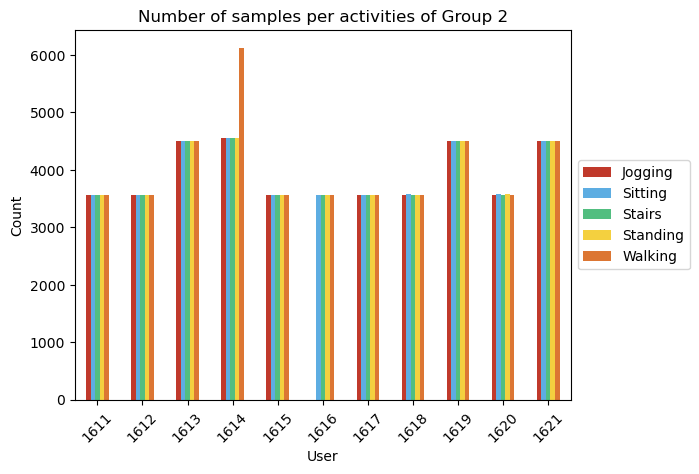

<Figure size 400x200 with 0 Axes>

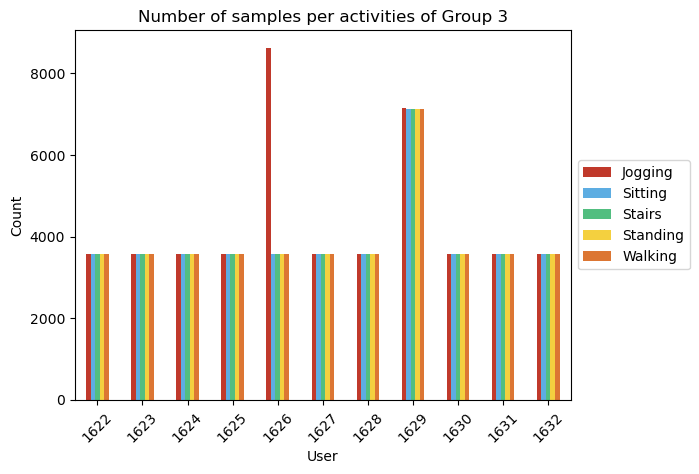

<Figure size 400x200 with 0 Axes>

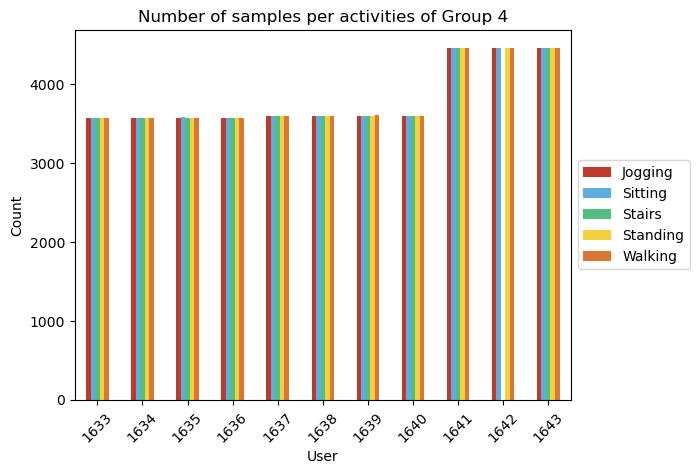

<Figure size 400x200 with 0 Axes>

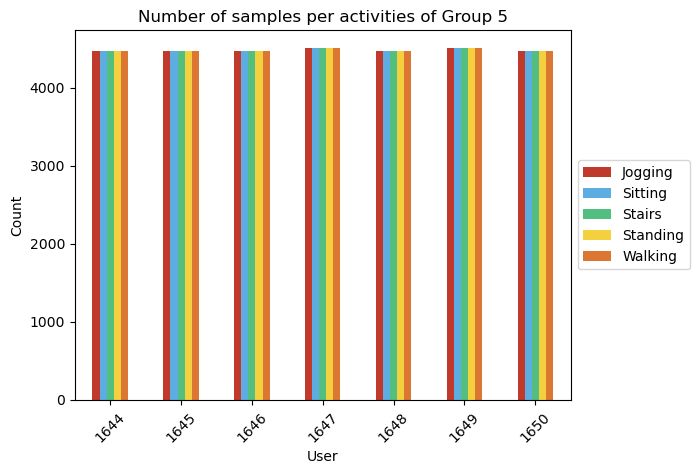

In [21]:
plot_activity_frequency(phone_gyro_data)

> The graphs show the phone gyroscope data. The counts vary significantly between users across the five activities: Jogging, Sitting, Stairs, Standing, and Walking. User 1626 has exceptionally high count (8000+) in jogging compared to other activities and users. Moreover, User 1614 has a higher count (6000) in walking than the other activities.

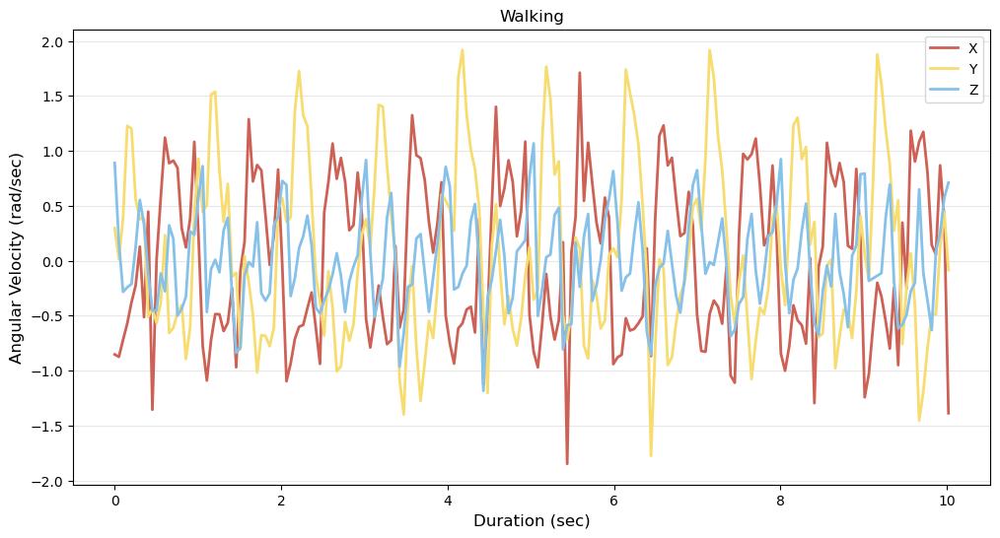

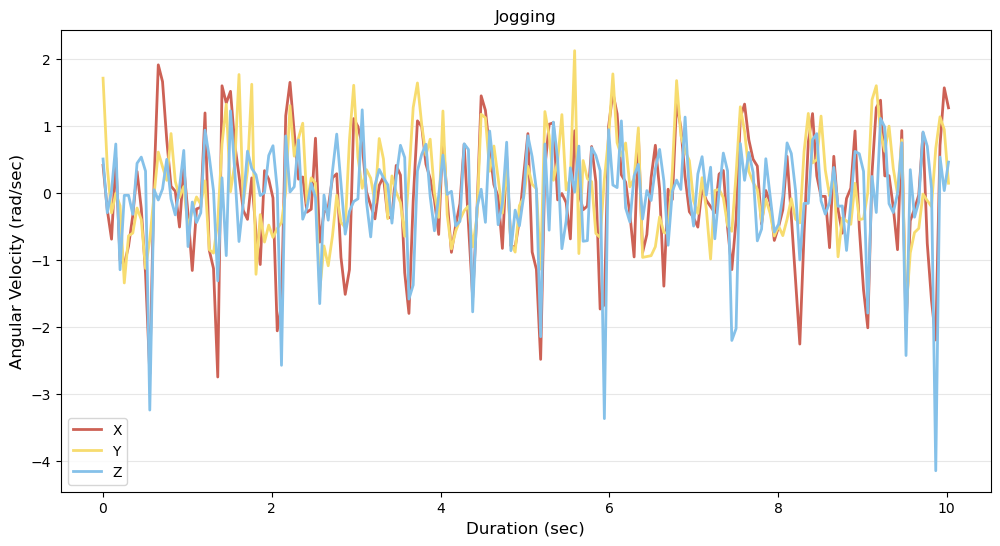

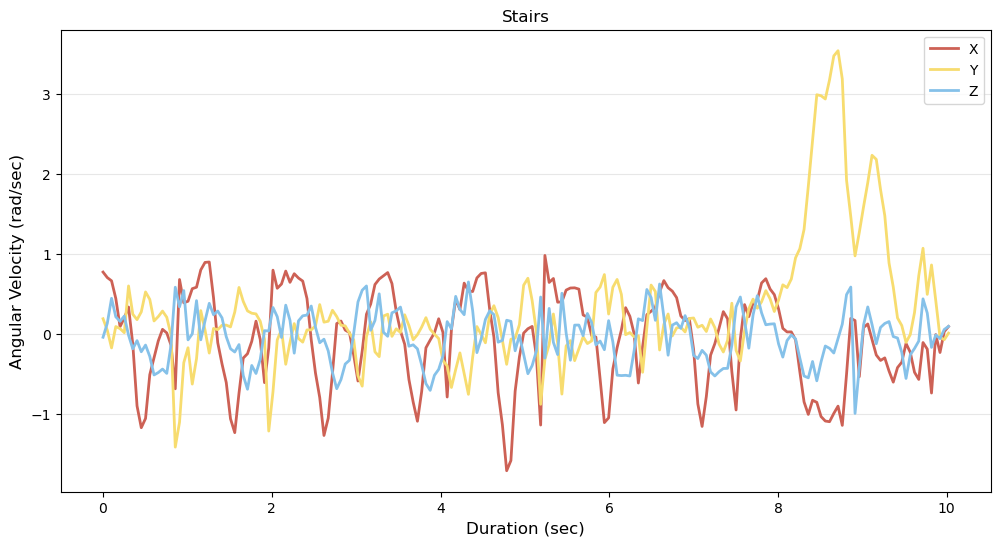

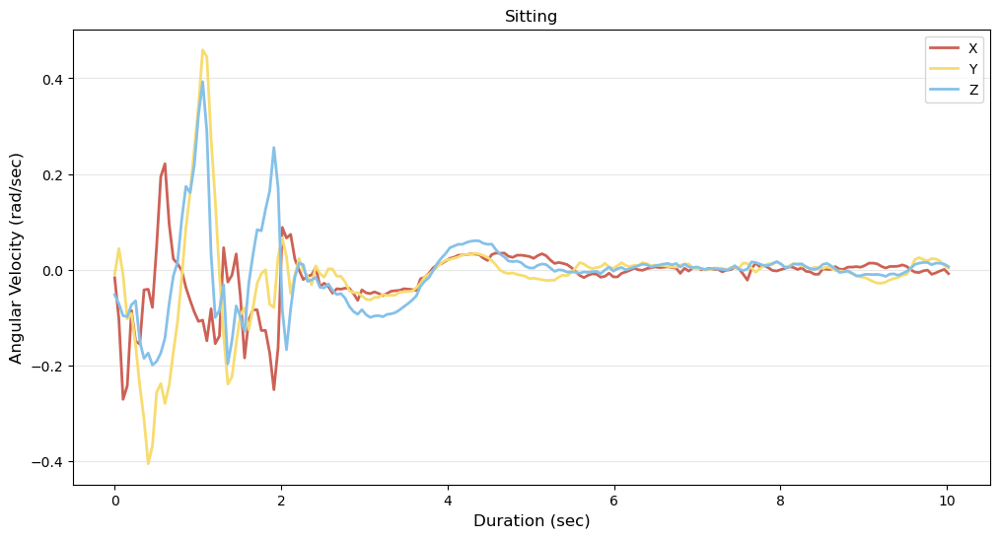

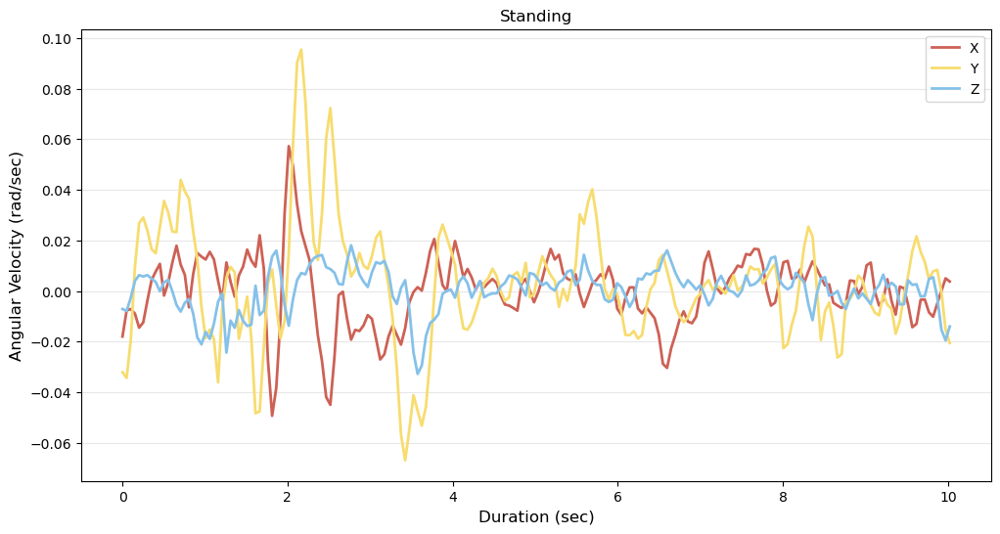

In [22]:
for activity in activities:
    show_angvelocity_per_activity(phone_gyro_data, activity, 'Phone', 10)

### Watch Acceleration

<Figure size 400x200 with 0 Axes>

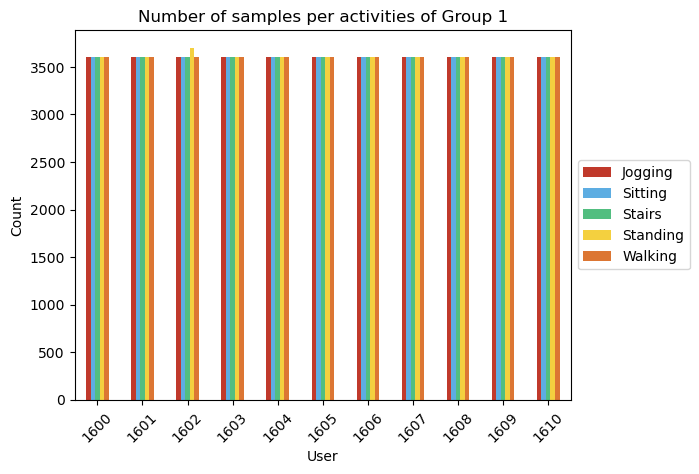

<Figure size 400x200 with 0 Axes>

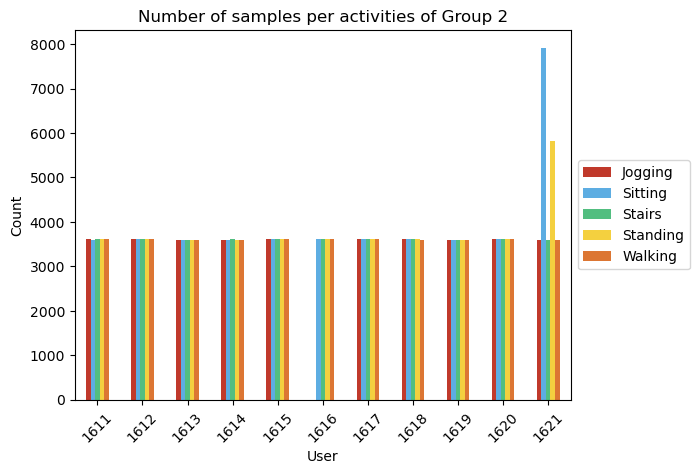

<Figure size 400x200 with 0 Axes>

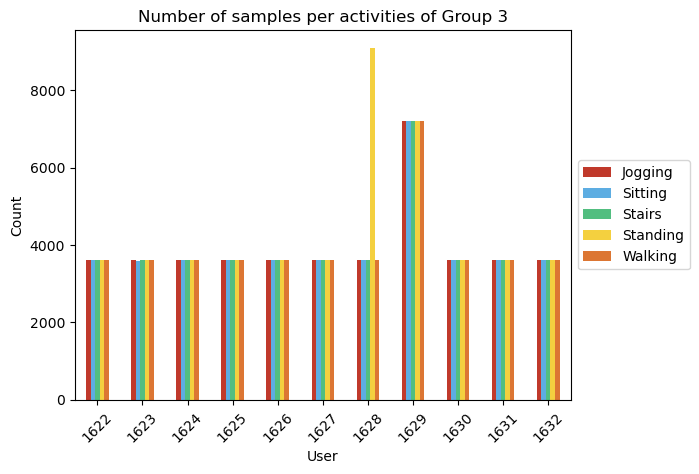

<Figure size 400x200 with 0 Axes>

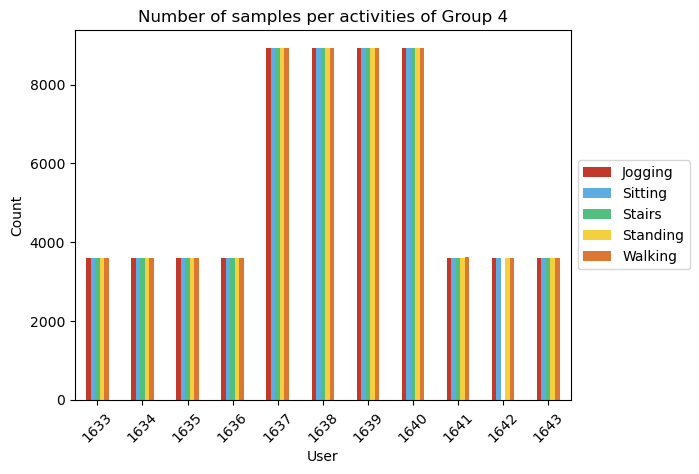

<Figure size 400x200 with 0 Axes>

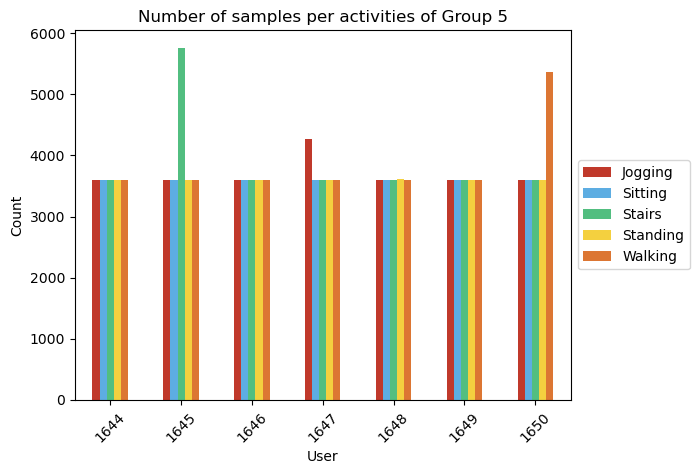

In [23]:
plot_activity_frequency(watch_accel_data)

> The graphs show the watch acceleration data. The counts vary significantly between users across the five activities: Jogging, Sitting, Stairs, Standing, and Walking. User 1628 has exceptionally high count (8000+) in standing compared to other activities and users. Furthermore, Users 1637, 1638,1639, and 1640 stand out with a notably high count (8000+) in all the activities compared to other users.

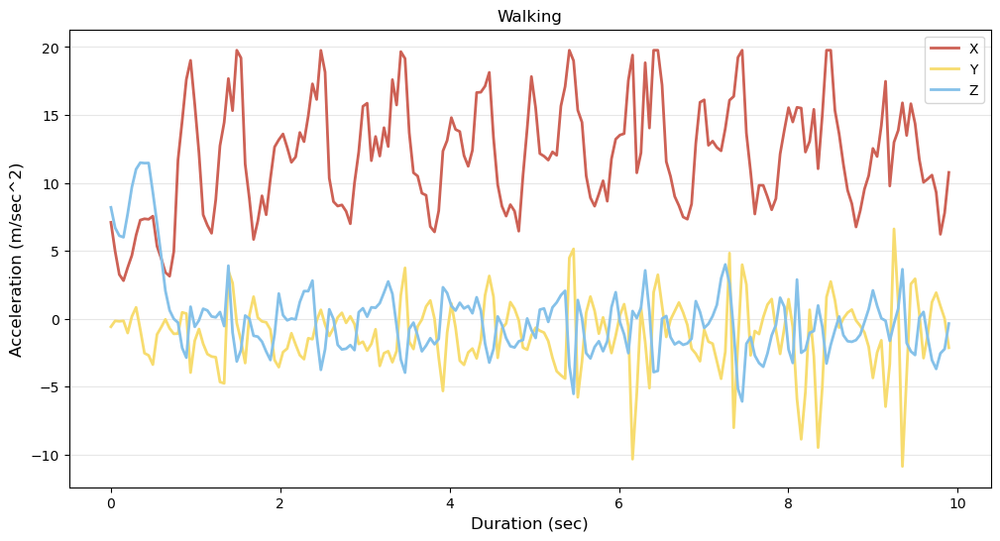

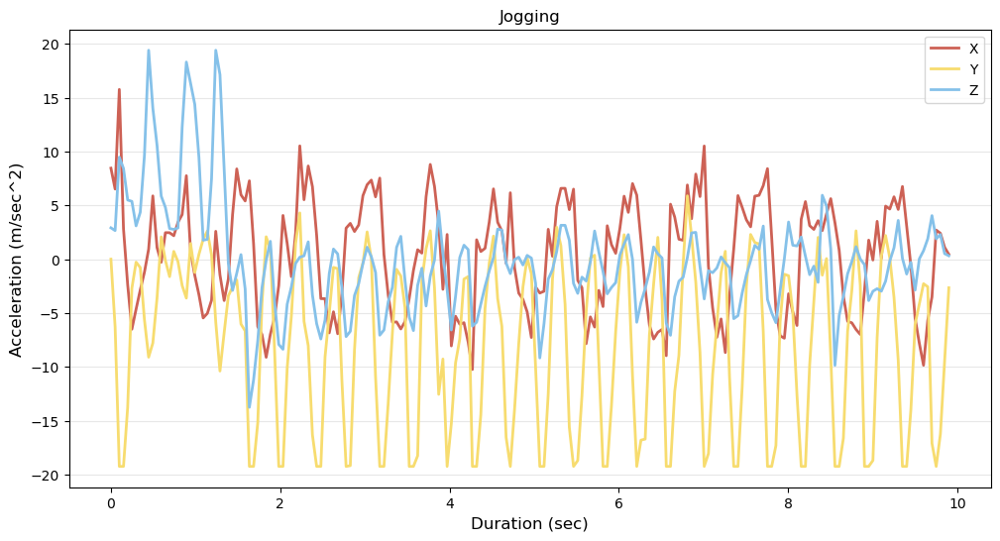

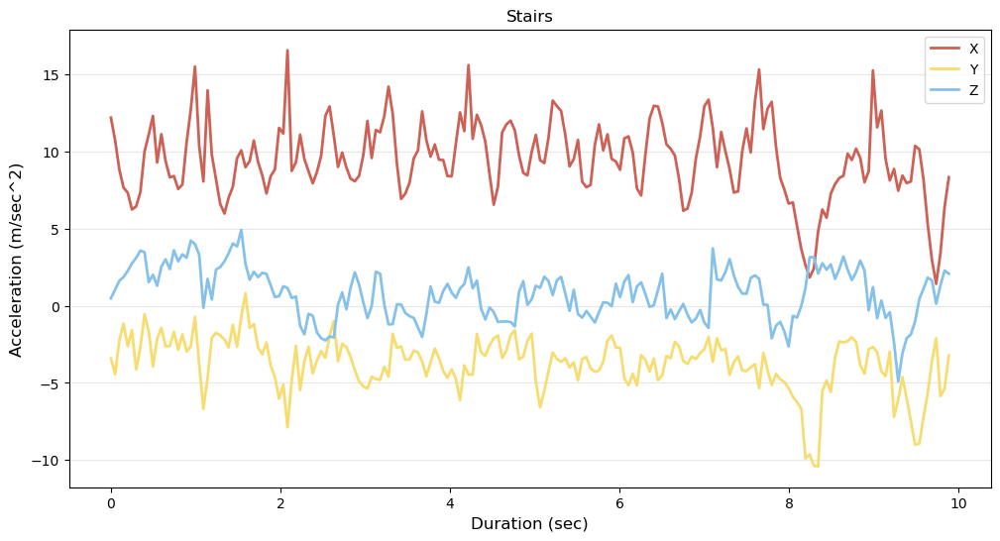

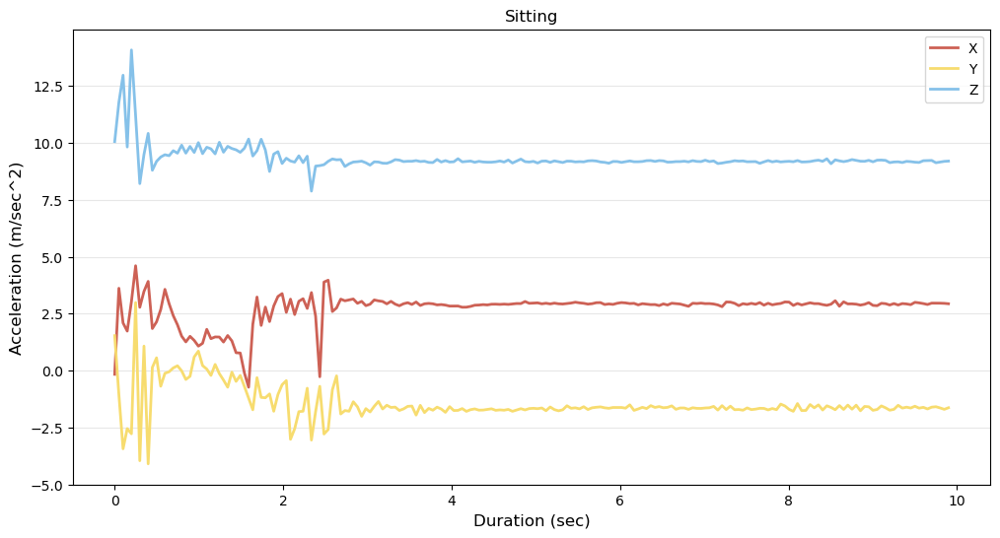

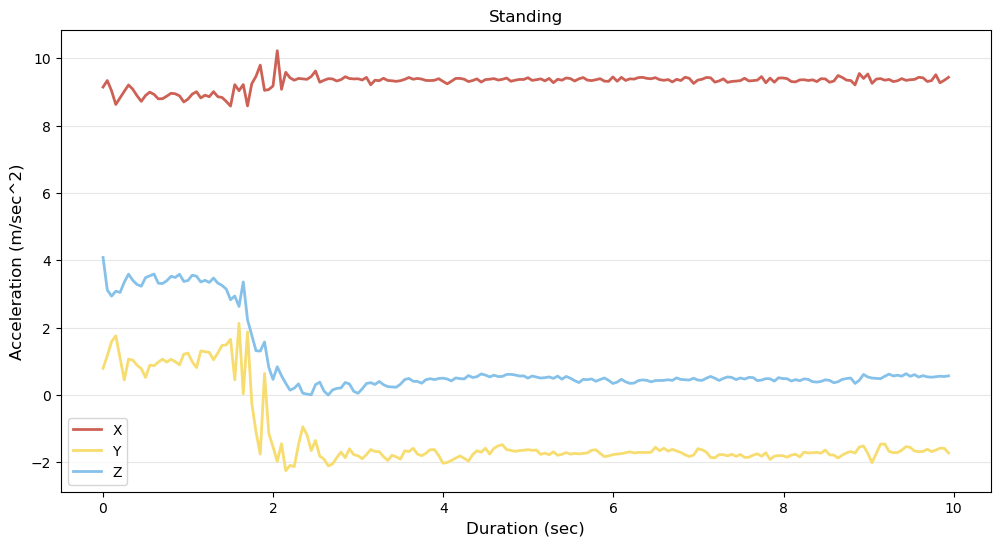

In [24]:
for activity in activities:
    show_accel_per_activity(watch_accel_data, activity, 'Watch', 10)

### Watch Gyroscope

<Figure size 400x200 with 0 Axes>

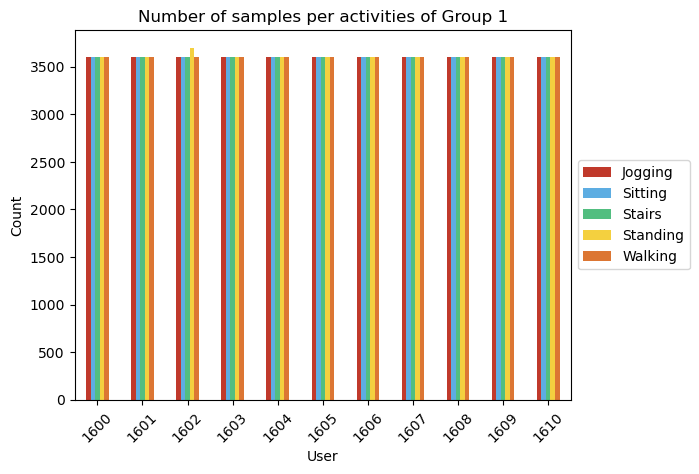

<Figure size 400x200 with 0 Axes>

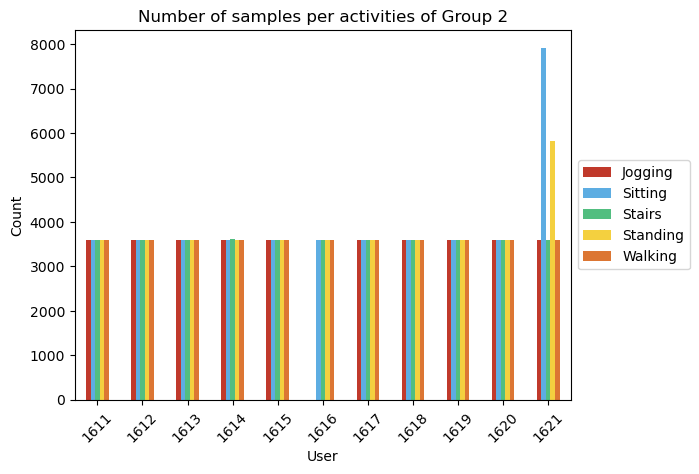

<Figure size 400x200 with 0 Axes>

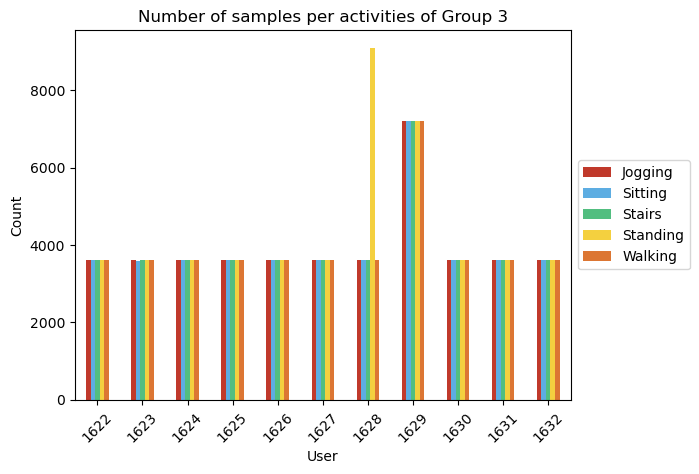

<Figure size 400x200 with 0 Axes>

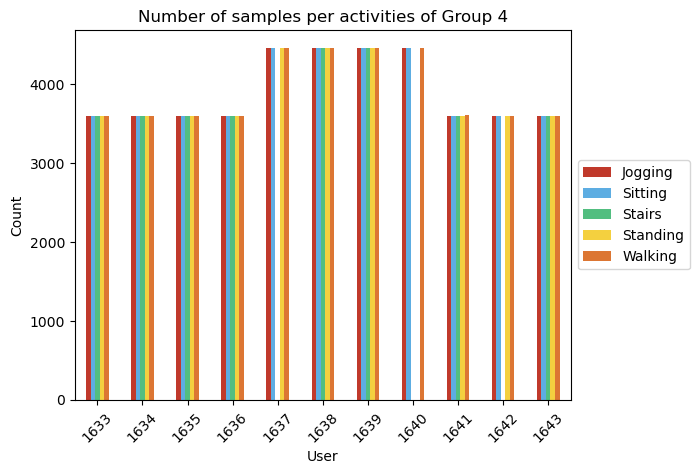

<Figure size 400x200 with 0 Axes>

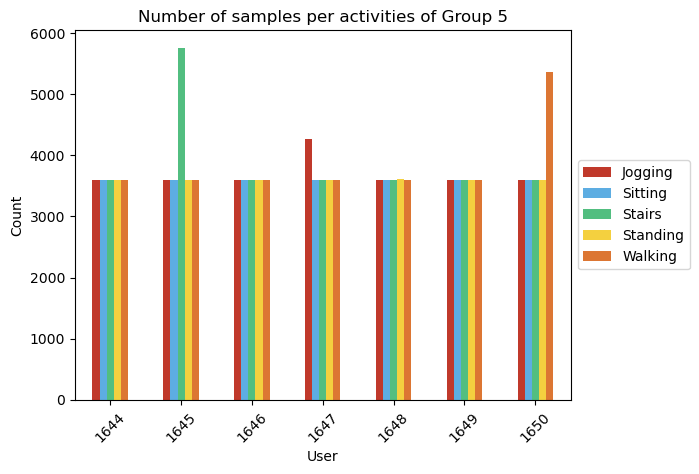

In [25]:
plot_activity_frequency(watch_gyro_data)

> The graphs show the watch gyroscope data. The counts vary significantly between users across the five activities: Jogging, Sitting, Stairs, Standing, and Walking. User 1628 has exceptionally high counts (8000+) in standing compared to other activities and users. The other users have more balanced activity counts with 3500 for each activity and no significant spikes.

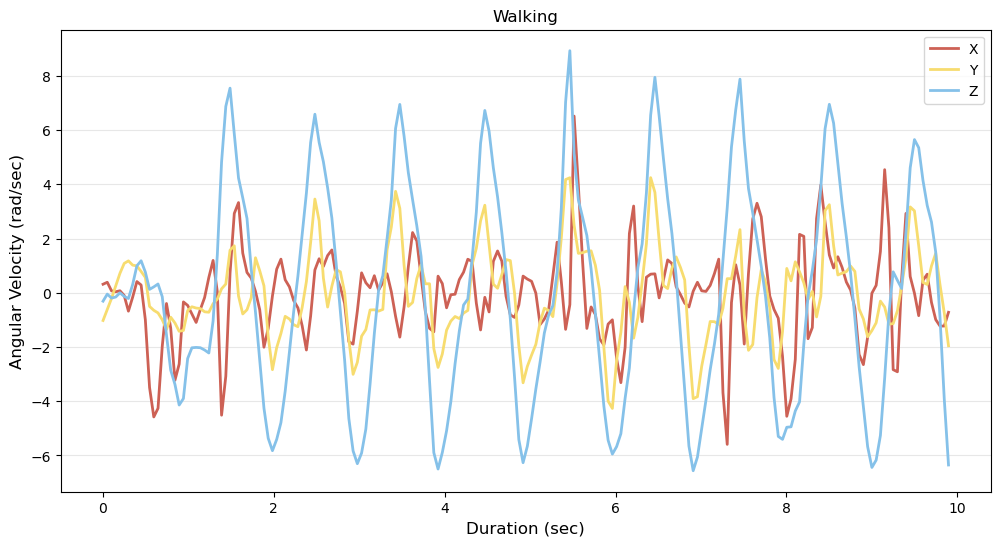

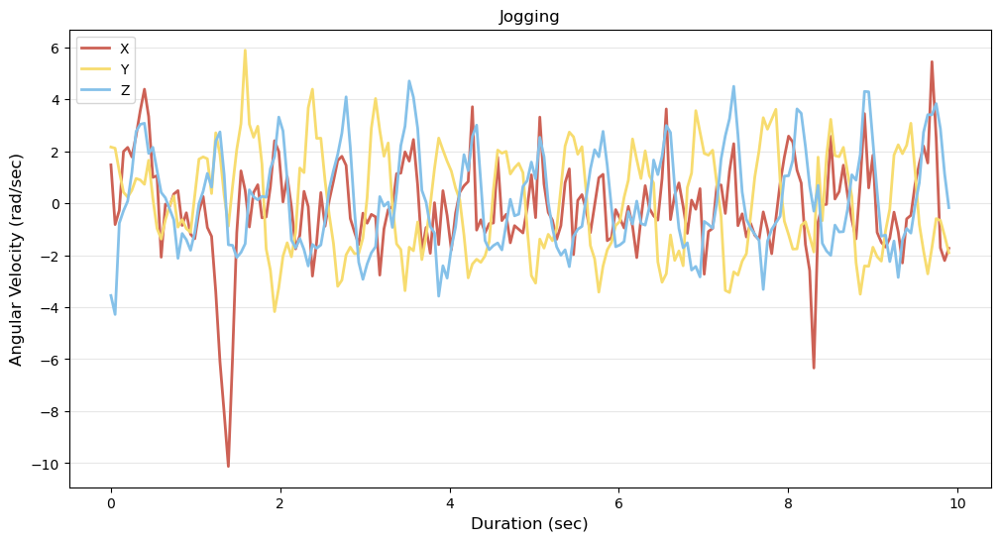

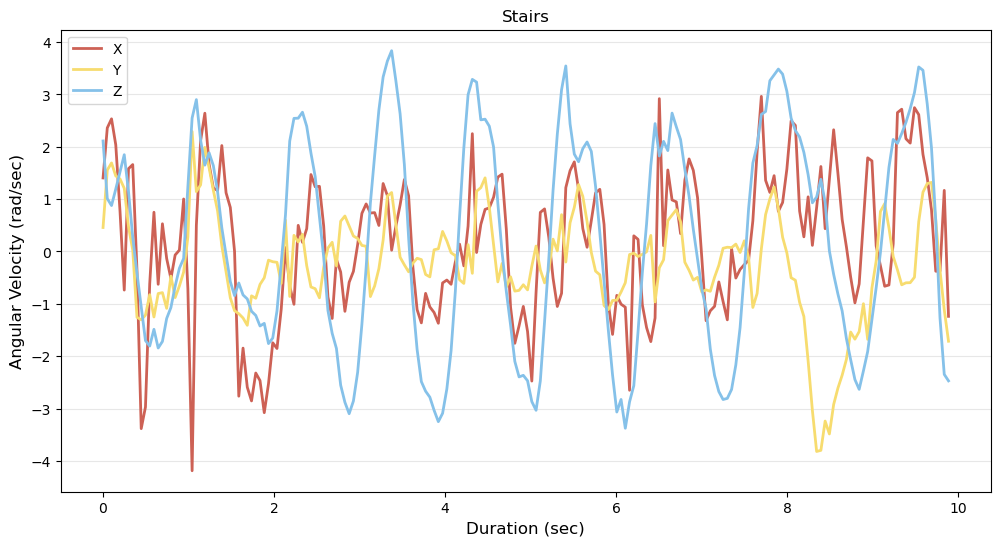

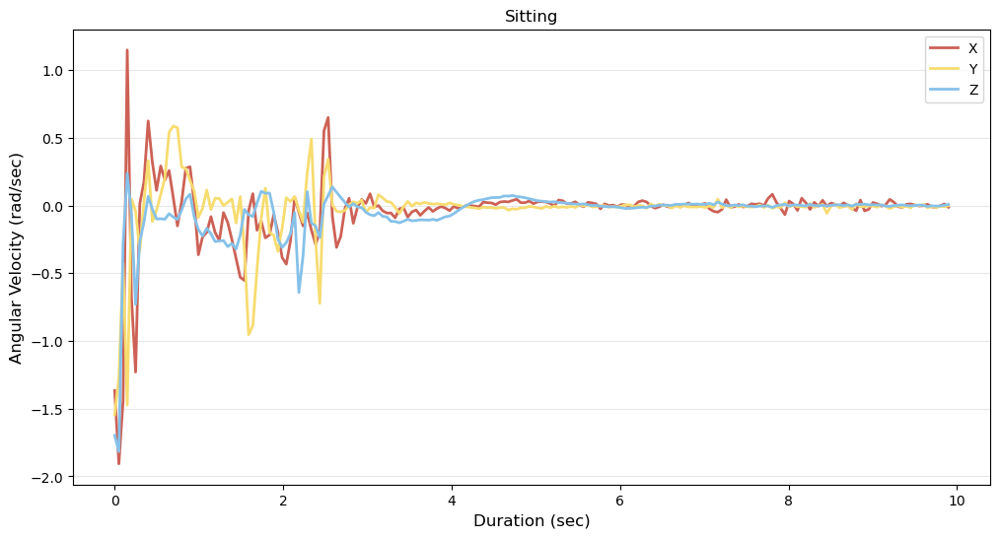

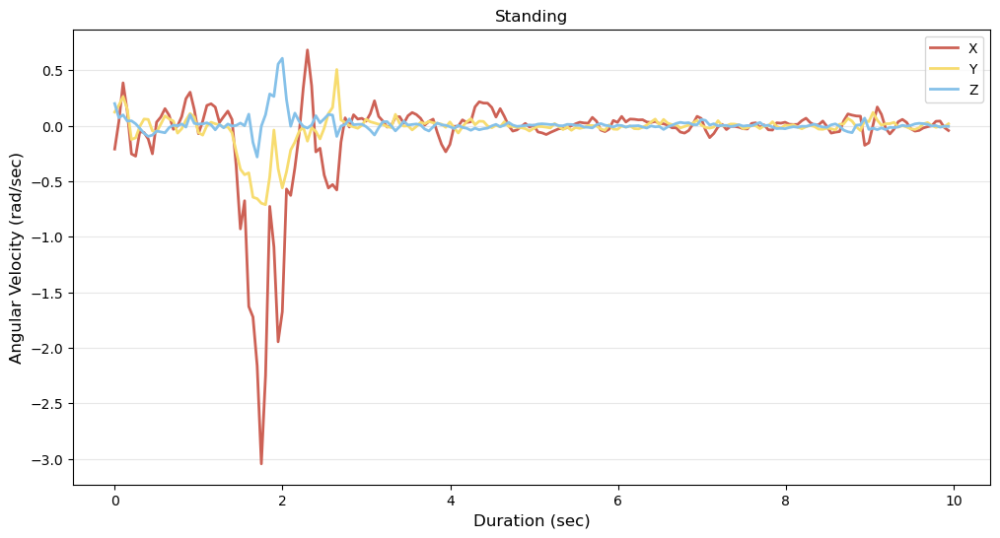

In [26]:
for activity in activities:
    show_angvelocity_per_activity(watch_gyro_data, activity, 'Watch', 10)

## Key Highlights

### Acceleration

#### Walking

> Both phone and watch accelerometers show patterns consistent with walking, given the expected rhytmic and repetitive nature of leg movement.

> The phone's accelerometer appears to capture a more subtle and varied range of motion, possible due to its placement in the pocket and the larger range of leg movement. The higher values on Y- axis could be due to the up and down motion of the leg while walking.

> The watch's accelerometer, being on the wrist, captures a more distinct lateral motion, reflecting the arm swing during walking. The higher values on the X-axis suggest a greater range of lateral movement compared to the phone.

#### Jogging

> The frequent jumps from -3 to 20 on the Y-axis during jogging susggest more vigorous and dynamic vertical movement compared to walking. This could be attributed to the increase force exerted on the phone while jogging.

> The negative values observed on the Y-axis of the watch accelerometer during jogging can be explained by the positioning and motion of the arms. When jogging, it is common for individuals to maintain a right-angled position of their arms, with the elbow forming a right angle. This arm position, combined with the rhythmic up-and-down movement of the arms during jogging, contributes to the negative acceleration values on the Y-axis.

> The initial high ups and downs on the Z-axis within the first 2 seconds may indicate an abrupt start or stop of jogging. Subsequently, the values stabilize between -5 and 5, reflecting consistent depth-related motion. 

#### Stairs

> On phone, the motion on the Y-axis ranges from 6 to 17, indicating a vertical movement associated with climbing stairs. The upward acceleration corresponds to ascending steps, while the downward acceleration corresponds to descending steps. The concurrent and consistent motion on the X and Z axes, ranging from 3 to -5, suggests lateral and depth-related movements during stair climbing.

> Across both devices, the consistency in values on the Y and Z axes suggests a relatively uniform vertical and depth-related motion during stair climbing. The variations on the X-axis (phone) and X-axis (watch) may be attributed to lateral movements associated with navigating stairs.

#### Sitting

> On phone, The transition from -0.2 to 0.2 and eventually settling at 0.0 on the X-axis suggests a subtle initial movement, potentially due to small adjustments or shifts in body posture. The pattern of 0.0 > -0.4 > 0.4 > 0.0 on the Y and Z axes indicates an initial settling phase, possibly associated with finding a comfortable seated position. 

> On the other hand, the accelerometer on watch shows initial variations during the first 2 seconds from 0.0 to 5 on the X-axis, 2.5 to -2.5 on the Y-axis, and 8 to 13 on the Z-axis.

> The phone accelerometer shows a quicker convergence to stable values (0.0) across all axes, indicating a faster settling into a stationary sitting position. This may be due to the placement of the phone on a stable surface or in a fixed pocket.

> The watch accelerometer exhibits slightly longer initial variations, possibly reflecting the freedom of arm movement and the time it takes to stabilize arm position while transitioning to a seated posture.

>The convergence to steady values after 2 seconds on both devices suggests that the individual has settled into a stable sitting posture. The steady values reflect the minimal movement typically associated with sitting comfortably.

#### Standing

>The phone accelerometer shows a more consistent and steady reading across all axes, indicating minimal movement. This aligns with the expectation of stability while standing.

>The watch accelerometer exhibits slight variations in the X, Y, and Z axes, suggesting the possibility of subtle hand or arm movements. The watch's position on the wrist allows for more freedom in arm motion, potentially leading to these minor shifts.

> Both devices show overall stability during standing, with minimal changes in acceleration values. The variations observed are subtle and likely associated with natural, involuntary movements rather than intentional actions.

### Gyroscope

#### Walking

> On phone, the gyroscope data exhibits a consistent oscillation between -2 and 2 on all X, Y, and Z axes throughout the 10-second duration. This pattern is indicative of the rhythmic and repetitive motion associated with walking. The variations in values suggest a continuous adjustment in orientation as one would expect during walking.

> For the watch gyroscope, there is a notable difference in amplitude with values ranging from -6 to 6 on all axes. This larger range indicates more pronounced movements, likely capturing the swinging motion of the arm during walking.

> The phone gyroscope’s relatively lower amplitude oscillations suggest that it is held or placed in a position with less freedom of movement compared to the watch. It captures essential but subdued aspects of walking dynamics.

> In contrast, the watch gyroscope’s higher amplitude reflects its exposure to broader ranges of motion due to its placement on the wrist. It provides a detailed representation of arm movements synchronized with steps.

> Both devices effectively capture the dynamic nature of walking through their respective oscillatory patterns across all three axes.

#### Jogging

> On phone, the gyroscope data fluctuates between -3 and 2 on the X-axis, indicating a consistent and dynamic movement pattern associated with jogging. The Y-axis shows a pattern of oscillation between -2 and 2, while the Z-axis ranges from -1 to 1. These variations suggest complex, multi-directional movements.

> On watch, the gyroscope readings are more pronounced with values ranging from -10 to 6 on the X-axis. The Y-axis exhibits fluctuations between -6 and 4, while the Z-axis varies from -8 to 2. This indicates a broader range of motion captured by the watch during jogging.

> The phone gyroscope displays rapid oscillations across all axes, reflecting the constant adjustments and shifts in position that occur during jogging. This could be attributed to its fixed position on the body where it captures overall body movements.

> In contrast, the watch gyroscope exhibits larger amplitude oscillations especially on X and Y axes which may be due to it being worn on the wrist capturing more localized movements of arm swinging during jogging.

> Both devices show continuous variations in their readings throughout the duration of jogging without converging to a steady state. This is indicative of ongoing dynamic movement associated with this activity.

#### Stairs

> On phone, the gyroscope data shows a consistent oscillation between -1 and 1 on all axes, X, Y, and Z during the initial 8 seconds. This could be indicative of the rhythmic movement associated with climbing stairs where there is a constant shift in orientation and acceleration.

> On watch, the gyroscope readings are more pronounced with values ranging from -4 to 4 on the X-axis. The Y-axis exhibits fluctuations between -3 to 3, while the Z-axis oscillates between -2 to 2. These larger variations may be attributed to the arm’s broader range of motion during stair climbing compared to the relatively stationary position of the phone.

> At around the 8-second mark on phone, there is a notable spike especially on the Z-axis reaching up to almost 3. This could represent a momentary increase in pace or an abrupt movement as one reaches the top of the stairs.

> In contrast, while there are also visible spikes in readings on watch at similar intervals, they are less pronounced than those observed in phone data. This might suggest that while both devices capture dynamic movements effectively; their placement results in varied amplitude of recorded data.

> Both devices return to more stable readings towards end indicating that stair climbing activity has ceased or stabilized.

#### Sitting

> On phone, the gyroscope data shows a significant fluctuation in the initial seconds, with the X-axis moving from -0.4 to 0.4, indicating a rapid adjustment in orientation. The Y and Z axes also exhibit similar patterns of movement, suggesting a comprehensive repositioning or adjustment while sitting.

> On watch, there is a pronounced variation in the first 2 seconds with values ranging from -2 to 1 on the X-axis and -1.5 to 0.5 on the Y-axis, indicating substantial movement or adjustment. The Z-axis remains relatively stable compared to the other two axes.

> The phone gyroscope data stabilizes quicker post-initial movement with minor fluctuations around zero across all axes, indicative of minimal movement after settling into position.

> In contrast, the watch gyroscope continues to show variations for an extended period before stabilizing; this could be attributed to more dynamic movements associated with arm positioning as opposed to core body stability.

> Both devices exhibit stabilization around zero after about 6 seconds for phone and slightly later for watch; this indicates that after initial adjustments, a stable sitting posture is maintained.

#### Standing

> On phone, the gyroscope data shows a significant fluctuation in the initial seconds, with the X-axis moving from -0.4 to 0.4, indicating a rapid adjustment in orientation. The Y and Z axes also exhibit similar patterns of movement, suggesting a comprehensive repositioning or adjustment while standing.
 
> On watch, there is a pronounced variation in the first 2 seconds with values ranging from -2 to 1 on the X-axis and -1.5 to 0.5 on the Y-axis, indicating substantial movement or adjustment. The Z-axis remains relatively stable compared to the other two axes.

> The phone gyroscope data stabilizes quicker post-initial movement with minor fluctuations around zero across all axes, indicative of minimal movement after settling into position.

> In contrast, the watch gyroscope continues to show variations for an extended period before stabilizing; especially for its x-axis during its initial seconds where it showed negative fluctuations.

## Data Transformation + Feature Engineering

In [27]:
phone_accel_data['Device'] = 'Phone'
phone_accel_data['Sensor'] = 'Accel'

watch_accel_data['Device'] = 'Watch'
watch_accel_data['Sensor'] = 'Accel'

phone_gyro_data['Device'] = 'Phone'
phone_gyro_data['Sensor'] = 'Gyro'

watch_gyro_data['Device'] = 'Watch'
watch_gyro_data['Sensor'] = 'Gyro'

combined_data = pd.concat([phone_accel_data, watch_accel_data, phone_gyro_data, watch_gyro_data], ignore_index=True)

In [28]:
combined_data

,SubjectID,Activity Code,Activity,Timestamp,X,Y,Z,Device,Sensor
0,1600,A,Walking,252207666810782,-0.364761,8.793503,1.055084,Phone,Accel
1,1600,A,Walking,252207717164786,-0.879730,9.768784,1.016998,Phone,Accel
2,1600,A,Walking,252207767518790,2.001495,11.109070,2.619156,Phone,Accel
3,1600,A,Walking,252207817872794,0.450623,12.651642,0.184555,Phone,Accel
4,1600,A,Walking,252207868226798,-2.164352,13.928436,-4.422485,Phone,Accel
...,...,...,...,...,...,...,...,...,...
4347885,1650,E,Standing,2425530011432855,-0.248304,-0.548543,-0.226238,Watch,Gyro
4347886,1650,E,Standing,2425530061425505,-0.268544,-0.394079,-0.181497,Watch,Gyro
4347887,1650,E,Standing,2425530111418155,-0.255761,-0.246007,-0.199606,Watch,Gyro
4347888,1650,E,Standing,2425530161410805,-0.322873,-0.096870,-0.235825,Watch,Gyro


In [29]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

def extract_features(df):
    grouped_data = df.groupby(['SubjectID', 'Device', 'Sensor'])
    extracted_rows = []
    rows_per_group = 200
    
    for (_, _, _), group in grouped_data:
        for i in range(0, len(group), rows_per_group):
            subset = group.iloc[i:i + rows_per_group]
            
            mean_x = subset['X'].mean()
            mean_y = subset['Y'].mean()
            mean_z = subset['Z'].mean()
            
            std_dev_x = subset['X'].std()
            std_dev_y = subset['Y'].std()
            std_dev_z = subset['Z'].std()

            abs_dev_x = subset['X'].mad()
            abs_dev_y = subset['Y'].mad()
            abs_dev_z = subset['Z'].mad()
            
            variance_x = subset['X'].var()
            variance_y = subset['Y'].var()
            variance_z = subset['Z'].var()

            extracted_rows.append({
                'SubjectID': subset['SubjectID'].iloc[0], 'Device': subset['Device'].iloc[0], 'Sensor': subset['Sensor'].iloc[0], 'Activity Code': subset['Activity Code'].mode().iloc[0],
                'AVERAGE(X)': mean_x, 'AVERAGE(Y)': mean_y, 'AVERAGE(Z)': mean_z,
                'MAD(X)': abs_dev_x, 'MAD(Y)': abs_dev_y, 'MAD(Z)': abs_dev_z,
                'STDEV(X)': std_dev_x, 'STDEV(Y)': std_dev_y, 'STDEV(Z)': std_dev_z,
                'VAR(X)': variance_x, 'VAR(Y)': variance_y, 'VAR(Z)': variance_z})

    extracted_df = pd.DataFrame(extracted_rows)
    return extracted_df

extracted_features = extract_features(combined_data)

In [30]:
extracted_features.head(10)

,SubjectID,Device,Sensor,Activity Code,AVERAGE(X),AVERAGE(Y),AVERAGE(Z),MAD(X),MAD(Y),MAD(Z),STDEV(X),STDEV(Y),STDEV(Z),VAR(X),VAR(Y),VAR(Z)
0,1600,Phone,Accel,A,-1.172309,9.570639,0.406854,1.590951,3.295082,1.609412,2.001460,4.016927,2.265584,4.005843,16.135706,5.132869
1,1600,Phone,Accel,A,-1.504971,9.565831,0.432132,1.778171,3.334897,1.682959,2.285838,4.082519,2.239964,5.225054,16.666963,5.017437
2,1600,Phone,Accel,A,-1.686600,9.385923,0.474974,1.705051,3.142438,1.692879,2.214540,3.818135,2.265545,4.904187,14.578156,5.132694
3,1600,Phone,Accel,A,-1.746612,9.542974,0.495973,1.623145,3.327896,1.579443,2.009270,4.017430,2.188970,4.037165,16.139746,4.791589
4,1600,Phone,Accel,A,-1.077078,9.637107,0.619938,1.488884,3.011961,1.459307,1.864886,3.635473,1.988884,3.477800,13.216663,3.955659
5,1600,Phone,Accel,A,-1.592536,9.559481,0.293671,1.692974,3.181658,1.591592,2.179004,3.894723,2.197702,4.748060,15.168866,4.829895
6,1600,Phone,Accel,A,-1.826592,9.573653,0.287647,1.645750,3.234332,1.626145,2.068967,3.957683,2.148228,4.280626,15.663254,4.614883
7,1600,Phone,Accel,A,-1.898373,9.544644,0.372899,1.553598,3.026383,1.682087,1.985188,3.608260,2.258932,3.940973,13.019542,5.102773
8,1600,Phone,Accel,A,-1.904607,9.544426,0.393636,1.481898,3.095430,1.568990,1.848669,3.752695,2.109877,3.417577,14.082720,4.451580
9,1600,Phone,Accel,A,-1.925410,9.592774,0.434418,1.655722,2.849825,1.498920,2.144065,3.459027,1.910548,4.597015,11.964870,3.650194


In [31]:
extracted_features.tail(10)

,SubjectID,Device,Sensor,Activity Code,AVERAGE(X),AVERAGE(Y),AVERAGE(Z),MAD(X),MAD(Y),MAD(Z),STDEV(X),STDEV(Y),STDEV(Z),VAR(X),VAR(Y),VAR(Z)
21865,1650,Watch,Gyro,E,0.004663,0.098935,-0.001578,0.117819,0.191822,0.082957,0.228136,0.548612,0.260113,0.052046,0.300975,0.067659
21866,1650,Watch,Gyro,E,-0.045708,-0.077020,-0.001290,0.229476,0.333962,0.182143,0.499832,0.731465,0.399990,0.249832,0.535040,0.159992
21867,1650,Watch,Gyro,E,-0.003300,0.000025,0.003263,0.023474,0.010901,0.009129,0.032020,0.014432,0.012317,0.001025,0.000208,0.000152
21868,1650,Watch,Gyro,E,-0.002479,0.000036,-0.001088,0.016267,0.010900,0.007699,0.022993,0.014036,0.011204,0.000529,0.000197,0.000126
21869,1650,Watch,Gyro,E,0.049601,0.026114,0.040681,0.095321,0.052112,0.077601,0.259931,0.147178,0.197805,0.067564,0.021661,0.039127
21870,1650,Watch,Gyro,E,0.024339,-0.050697,0.015178,0.220762,0.162115,0.132653,0.553408,0.331996,0.300829,0.306261,0.110221,0.090498
21871,1650,Watch,Gyro,E,-0.010154,0.001624,0.000408,0.022818,0.008320,0.005537,0.035444,0.011311,0.006770,0.001256,0.000128,0.000046
21872,1650,Watch,Gyro,E,-0.015385,0.020181,-0.020508,0.268481,0.184229,0.158370,0.700469,0.491158,0.413509,0.490657,0.241236,0.170990
21873,1650,Watch,Gyro,E,0.000030,0.000681,0.000296,0.052594,0.018417,0.014131,0.101670,0.025496,0.022062,0.010337,0.000650,0.000487
21874,1650,Watch,Gyro,E,0.066081,0.089233,0.061754,0.191797,0.234012,0.168661,0.354383,0.425647,0.291187,0.125587,0.181176,0.084790


In [32]:
activity_counts = extracted_features.pivot_table(index=['Activity Code'], columns=['Device', 'Sensor'], aggfunc='size', fill_value=0)
activity_counts['Total'] = activity_counts.sum(axis=1)
activity_counts.loc['Total'] = activity_counts.sum()

In [33]:
activity_counts

Device        Phone       Watch        Total
Sensor        Accel  Gyro Accel  Gyro       
Activity Code                               
A              1409  1026  1053   961   4449
B              1334  1004  1025   941   4304
C              1285   996  1037   901   4219
D              1307   984  1066   974   4331
E              1386  1052  1125  1009   4572
Total          6721  5062  5306  4786  21875

> We expect to have 12.75 hours of examples per sensor (since there are 51 subjects performing 5 activities for 3 minutes per activity). To determine the number of 10-second intervals in 12.75, we multiply 12.75 by 60 (minutes/ hour) and then by 6, since there are 6 10-second intervals in a minute. This yields 4,590 examples. We see that is about what we have for three of the four sensors, although we have more for the phone accelerometer, which is consistent with what we say with the raw time series data.

The provided Python code defines a function extract_features that takes a DataFrame df containing sensor data grouped by `SubjectID`, `Device`, and `Sensor`. For each group, it extracts features such as mean, standard deviation, absolute deviation, variance, and binned distribution for the X, Y, and Z axes of the sensor readings. The binned distribution is calculated using a helper function calculate_binned_distribution. The extracted features are then organized into a new DataFrame extracted_df, which includes information about the subject, device, sensor, activity code, and various statistical measures for each sensor axis.

In [34]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

def calculate_binned_distribution(axis_values):
    # Calculate binned distribution for a given axis
    range_values = axis_values.max() - axis_values.min()
    bins = np.linspace(axis_values.min(), axis_values.max(), 11) 
    binned_distribution, _ = np.histogram(axis_values, bins=bins, density=True)
    return binned_distribution

def extract_features(df):
    grouped_data = df.groupby(['SubjectID', 'Device', 'Sensor'])
    extracted_rows = []
    rows_per_group = 200
    
    for (_, _, _), group in grouped_data:
        for i in range(0, len(group), rows_per_group):
            subset = group.iloc[i:i + rows_per_group]
            
            mean_x = subset['X'].mean()
            mean_y = subset['Y'].mean()
            mean_z = subset['Z'].mean()
            
            std_dev_x = subset['X'].std()
            std_dev_y = subset['Y'].std()
            std_dev_z = subset['Z'].std()

            abs_dev_x = subset['X'].mad()
            abs_dev_y = subset['Y'].mad()
            abs_dev_z = subset['Z'].mad()
            
            variance_x = subset['X'].var()
            variance_y = subset['Y'].var()
            variance_z = subset['Z'].var()

            # Calculate binned distribution for X, Y, Z axes
            binned_dist_x = calculate_binned_distribution(subset['X'])
            binned_dist_y = calculate_binned_distribution(subset['Y'])
            binned_dist_z = calculate_binned_distribution(subset['Z'])

            extracted_rows.append({
                'SubjectID': subset['SubjectID'].iloc[0], 'Device': subset['Device'].iloc[0], 'Sensor': subset['Sensor'].iloc[0], 'Activity Code': subset['Activity Code'].mode().iloc[0],
                'X0': binned_dist_x[0], 'X1': binned_dist_x[1], 'X2': binned_dist_x[2], 'X3': binned_dist_x[3], 'X4': binned_dist_x[4],
                'X5': binned_dist_x[5], 'X6': binned_dist_x[6], 'X7': binned_dist_x[7], 'X8': binned_dist_x[8], 'X9': binned_dist_x[9],
                'Y0': binned_dist_y[0], 'Y1': binned_dist_y[1], 'Y2': binned_dist_y[2], 'Y3': binned_dist_y[3], 'Y4': binned_dist_y[4],
                'Y5': binned_dist_y[5], 'Y6': binned_dist_y[6], 'Y7': binned_dist_y[7], 'Y8': binned_dist_y[8], 'Y9': binned_dist_y[9],
                'Z0': binned_dist_z[0], 'Z1': binned_dist_z[1], 'Z2': binned_dist_z[2], 'Z3': binned_dist_z[3], 'Z4': binned_dist_z[4],
                'Z5': binned_dist_z[5], 'Z6': binned_dist_z[6], 'Z7': binned_dist_z[7], 'Z8': binned_dist_z[8], 'Z9': binned_dist_z[9],
                'AVERAGE(X)': mean_x, 'AVERAGE(Y)': mean_y, 'AVERAGE(Z)': mean_z,
                'MAD(X)': abs_dev_x, 'MAD(Y)': abs_dev_y, 'MAD(Z)': abs_dev_z,
                'STDEV(X)': std_dev_x, 'STDEV(Y)': std_dev_y, 'STDEV(Z)': std_dev_z,
                'VAR(X)': variance_x, 'VAR(Y)': variance_y, 'VAR(Z)': variance_z
            })

    extracted_df = pd.DataFrame(extracted_rows)
    return extracted_df

extracted_features = extract_features(combined_data)

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [35]:
extracted_features

,SubjectID,Device,Sensor,Activity Code,X0,X1,X2,X3,X4,X5,...,AVERAGE(Z),MAD(X),MAD(Y),MAD(Z),STDEV(X),STDEV(Y),STDEV(Z),VAR(X),VAR(Y),VAR(Z)
0,1600,Phone,Accel,A,0.004261,0.008522,0.042610,0.072437,0.119307,0.161917,...,0.406854,1.590951,3.295082,1.609412,2.001460,4.016927,2.265584,4.005843,16.135706,5.132869
1,1600,Phone,Accel,A,0.025373,0.021144,0.050747,0.054976,0.105722,0.181842,...,0.432132,1.778171,3.334897,1.682959,2.285838,4.082519,2.239964,5.225054,16.666963,5.017437
2,1600,Phone,Accel,A,0.021250,0.010625,0.031875,0.067292,0.184167,0.173542,...,0.474974,1.705051,3.142438,1.692879,2.214540,3.818135,2.265545,4.904187,14.578156,5.132694
3,1600,Phone,Accel,A,0.042629,0.058614,0.063943,0.095914,0.143871,0.181171,...,0.495973,1.623145,3.327896,1.579443,2.009270,4.017430,2.188970,4.037165,16.139746,4.791589
4,1600,Phone,Accel,A,0.018611,0.023264,0.069793,0.088405,0.167503,0.200074,...,0.619938,1.488884,3.011961,1.459307,1.864886,3.635473,1.988884,3.477800,13.216663,3.955659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21870,1650,Watch,Gyro,E,0.031281,0.046921,1.345070,0.078202,0.031281,0.015640,...,0.015178,0.220762,0.162115,0.132653,0.553408,0.331996,0.300829,0.306261,0.110221,0.090498
21871,1650,Watch,Gyro,E,0.311872,0.467808,0.000000,0.467808,3.430590,12.630807,...,0.000408,0.022818,0.008320,0.005537,0.035444,0.011311,0.006770,0.001256,0.000128,0.000046
21872,1650,Watch,Gyro,E,0.020991,0.000000,0.013994,0.013994,0.174928,1.077557,...,-0.020508,0.268481,0.184229,0.158370,0.700469,0.491158,0.413509,0.490657,0.241236,0.170990
21873,1650,Watch,Gyro,E,0.042323,0.000000,0.084647,0.380911,6.263870,1.269703,...,0.000296,0.052594,0.018417,0.014131,0.101670,0.025496,0.022062,0.010337,0.000650,0.000487


### One Hot Encoding

The code uses Pandas' get_dummies function to perform one-hot encoding on categorical columns `Device` and `Sensor` in the DataFrame `extracted_features`. This process converts categorical variables into binary columns, creating new binary columns for each unique category, and assigns 1 or 0 to indicate the presence or absence of the corresponding category in each row. The resulting DataFrame ohe_df includes these one-hot encoded columns, providing a numerical representation of categorical information suitable for machine learning algorithms.

In [36]:
ohe_df = pd.get_dummies(extracted_features, columns=['Device', 'Sensor'])

In [37]:
ohe_df

,SubjectID,Activity Code,X0,X1,X2,X3,X4,X5,X6,X7,...,STDEV(X),STDEV(Y),STDEV(Z),VAR(X),VAR(Y),VAR(Z),Device_Phone,Device_Watch,Sensor_Accel,Sensor_Gyro
0,1600,A,0.004261,0.008522,0.042610,0.072437,0.119307,0.161917,0.213049,0.153395,...,2.001460,4.016927,2.265584,4.005843,16.135706,5.132869,1,0,1,0
1,1600,A,0.025373,0.021144,0.050747,0.054976,0.105722,0.181842,0.194529,0.152240,...,2.285838,4.082519,2.239964,5.225054,16.666963,5.017437,1,0,1,0
2,1600,A,0.021250,0.010625,0.031875,0.067292,0.184167,0.173542,0.173542,0.042500,...,2.214540,3.818135,2.265545,4.904187,14.578156,5.132694,1,0,1,0
3,1600,A,0.042629,0.058614,0.063943,0.095914,0.143871,0.181171,0.213143,0.175843,...,2.009270,4.017430,2.188970,4.037165,16.139746,4.791589,1,0,1,0
4,1600,A,0.018611,0.023264,0.069793,0.088405,0.167503,0.200074,0.237297,0.111669,...,1.864886,3.635473,1.988884,3.477800,13.216663,3.955659,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21870,1650,E,0.031281,0.046921,1.345070,0.078202,0.031281,0.015640,0.000000,0.007820,...,0.553408,0.331996,0.300829,0.306261,0.110221,0.090498,0,1,0,1
21871,1650,E,0.311872,0.467808,0.000000,0.467808,3.430590,12.630807,12.007064,1.715295,...,0.035444,0.011311,0.006770,0.001256,0.000128,0.000046,0,1,0,1
21872,1650,E,0.020991,0.000000,0.013994,0.013994,0.174928,1.077557,0.062974,0.006997,...,0.700469,0.491158,0.413509,0.490657,0.241236,0.170990,0,1,0,1
21873,1650,E,0.042323,0.000000,0.084647,0.380911,6.263870,1.269703,0.296264,0.000000,...,0.101670,0.025496,0.022062,0.010337,0.000650,0.000487,0,1,0,1


In [38]:
ohe_df_breakpoint = ohe_df.copy()

In [39]:
ohe_df.drop(['STDEV(X)','STDEV(Y)','STDEV(Z)','VAR(X)','VAR(Y)','VAR(Z)'], axis = 1, inplace = True)

The code utilizes scikit-learn's train_test_split function to split the one-hot encoded DataFrame `ohe_df` into training and testing sets for a machine learning model. The target variable `Activity Code` is assigned to y, and the features are stored in X. The function then divides the data into training (70%) and testing (30%) sets, with the stratify parameter ensuring that the distribution of the target variable is maintained in both sets, and the shuffle parameter enables random shuffling of the data before splitting. 

In [40]:
from sklearn.model_selection import train_test_split

y = ohe_df['Activity Code']
X = ohe_df.drop(['Activity Code', 'SubjectID'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.7, 
                                                    test_size=0.3,
                                                    shuffle=True, 
                                                    stratify=ohe_df['Activity Code'])


## K-Nearest Neighbors Classifier

The K-Nearest Neighbors (KNN) Classifier is a supervised machine learning algorithm used for classification tasks. It classifies a data point by assigning it the majority class among its k-nearest neighbors in the feature space, where "k" is a user-defined parameter representing the number of neighbors to consider.

### KFold Cross Validation

In [41]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

This implements a K-Nearest Neighbors (KNN) classifier with 5 neighbors on a dataset, using 5-fold cross-validation. It calculates and prints the mean accuracy, precision, recall, and F1 score of the model across the folds.

In [42]:
X_train = X_train.dropna()
y_train = y_train.loc[X_train.index]

X_train_np = X_train.values
y_train_np = y_train.values

n_neighbors = 5

knn_classifier = KNeighborsClassifier(n_neighbors=n_neighbors)

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for train_index, val_index in kf.split(X_train_np):
    X_fold_train, X_fold_val = X_train_np[train_index], X_train_np[val_index]
    y_fold_train, y_fold_val = y_train_np[train_index], y_train_np[val_index]

    knn_classifier.fit(X_fold_train, y_fold_train)
    y_pred_val = knn_classifier.predict(X_fold_val)

    accuracy = accuracy_score(y_fold_val, y_pred_val) * 100
    precision = precision_score(y_fold_val, y_pred_val, average='weighted') * 100
    recall = recall_score(y_fold_val, y_pred_val, average='weighted') * 100
    f1 = f1_score(y_fold_val, y_pred_val, average='weighted')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

mean_accuracy = np.mean(accuracy_scores)
mean_precision = np.mean(precision_scores)
mean_recall = np.mean(recall_scores)
mean_f1 = np.mean(f1_scores)

print(f'Mean Accuracy: {mean_accuracy:.2f}%')
print(f'Mean Precision: {mean_precision:.2f}%')
print(f'Mean Recall: {mean_recall:.2f}%')
print(f'Mean F1 Score: {mean_f1:.4f}')


Mean Accuracy: 83.12%
Mean Precision: 83.27%
Mean Recall: 83.12%
Mean F1 Score: 0.8293


The results presented are the average metrics over 5 folds in the cross-validation process. This includes a mean accuracy of 83.12%, precision of 83.27%, recall of 83.12%, and F1 score of 0.8293. These averages provide a more robust measure of the KNN classifier’s performance.

### KNN Test Set

In [43]:
X_test = X_test.dropna()
y_test = y_test.loc[X_test.index]
X_test_np = X_test.values
y_pred_test = knn_classifier.predict(X_test_np)

accuracy_test = accuracy_score(y_test, y_pred_test) * 100
precision_test = precision_score(y_test, y_pred_test, average='weighted') * 100
recall_test = recall_score(y_test, y_pred_test, average='weighted') * 100
f1_test = f1_score(y_test, y_pred_test, average='weighted')

print('\nResults on the Test Set:')
print(f'Accuracy: {accuracy_test:.2f}%')
print(f'Precision: {precision_test:.2f}%')
print(f'Recall: {recall_test:.2f}%')
print(f'F1 Score: {f1_test:.4f}')


Results on the Test Set:
Accuracy: 82.87%
Precision: 82.88%
Recall: 82.87%
F1 Score: 0.8267


The metrics reported - accuracy of 82.87%, precision of 82.88%, recall of 82.87%, and F1 score of 0.8267 - are calculated based on the model’s predictions on this unseen test data. These metrics provide an estimate of how well the model is likely to perform on new, similar data.

### KNN Hyperparameter Tuning

In [44]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {'n_neighbors': range(1, 31), 'weights': ['uniform', 'distance'], 'p': [1, 2]}

knn_classifier_tuned = KNeighborsClassifier()

random_search = RandomizedSearchCV(knn_classifier_tuned, param_distributions=param_dist, n_iter=10, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(X_train_np, y_train_np)
best_params = random_search.best_params_
print('Best Hyperparameters:', best_params)

best_knn_classifier = random_search.best_estimator_
y_pred_test_tuned = best_knn_classifier.predict(X_test_np)

accuracy_test_tuned = accuracy_score(y_test, y_pred_test_tuned) * 100
precision_test_tuned = precision_score(y_test, y_pred_test_tuned, average='weighted') * 100
recall_test_tuned = recall_score(y_test, y_pred_test_tuned, average='weighted') * 100
f1_test_tuned = f1_score(y_test, y_pred_test_tuned, average='weighted')

print('\nResults on the Test Set (Tuned KNN Model):')
print(f'Accuracy: {accuracy_test_tuned:.2f}%')
print(f'Precision: {precision_test_tuned:.2f}%')
print(f'Recall: {recall_test_tuned:.2f}%')
print(f'F1 Score: {f1_test_tuned:.4f}')

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [       nan 0.8224923         nan 0.81818231 0.82530103        nan
 0.81733343 0.83627218        nan 0.7960425 ]
  warnings.warn(


Best Hyperparameters: {'weights': 'uniform', 'p': 2, 'n_neighbors': 3}

Results on the Test Set (Tuned KNN Model):
Accuracy: 83.01%
Precision: 82.98%
Recall: 83.01%
F1 Score: 0.8281


This process searches over a specified parameter space and aims to find the best parameters that improve the model’s performance. The tuned KNN model, with the optimal parameters found, is then used to predict on the test set, achieving an accuracy of 83.01%, precision of 82.98%, recall of 83.01%, and F1 score of 0.8281. This demonstrates the effectiveness of hyperparameter tuning in enhancing model performance.

### KNN Confusion Matrix

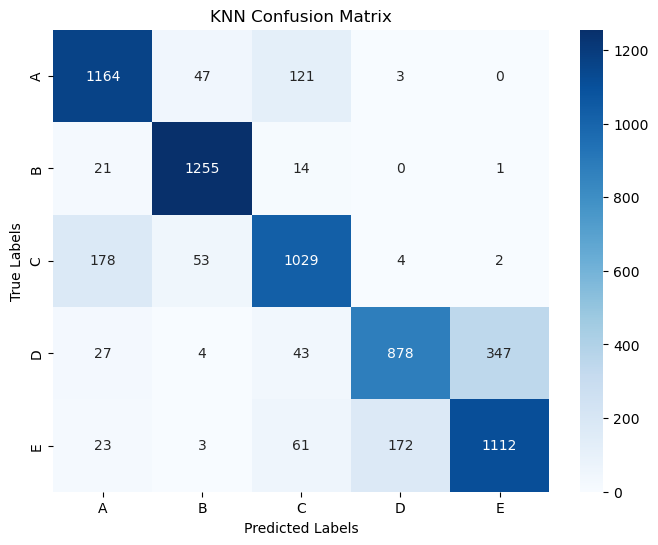

In [45]:
from sklearn.metrics import confusion_matrix

X_test_np = X_test.values

y_pred_test = knn_classifier.predict(X_test_np)

conf_matrix = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=sorted(y_test.unique()), yticklabels=sorted(y_test.unique()))
plt.title('KNN Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


The confusion matrix visualizes the performance of the KNN classifier. The diagonal elements represent correct predictions (e.g., 1164 ‘A’ labels were correctly predicted), while off-diagonal elements indicate misclassifications (e.g., 121 ‘A’ true labels were predicted as ‘C’), highlighting areas where the model might need improvement.

## Random Forest Classifier

### KFold Cross Validation

In [46]:
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

accuracy_scores_rf = []
precision_scores_rf = []
recall_scores_rf = []
f1_scores_rf = []

for train_index, val_index in kf.split(X_train_np):
    X_fold_train, X_fold_val = X_train_np[train_index], X_train_np[val_index]
    y_fold_train, y_fold_val = y_train_np[train_index], y_train_np[val_index]

    rf_classifier.fit(X_fold_train, y_fold_train)
    y_pred_val_rf = rf_classifier.predict(X_fold_val)

    accuracy_rf = accuracy_score(y_fold_val, y_pred_val_rf) * 100
    precision_rf = precision_score(y_fold_val, y_pred_val_rf, average='weighted') * 100
    recall_rf = recall_score(y_fold_val, y_pred_val_rf, average='weighted') * 100
    f1_rf = f1_score(y_fold_val, y_pred_val_rf, average='weighted')

    accuracy_scores_rf.append(accuracy_rf)
    precision_scores_rf.append(precision_rf)
    recall_scores_rf.append(recall_rf)
    f1_scores_rf.append(f1_rf)

mean_accuracy_rf = np.mean(accuracy_scores_rf)
mean_precision_rf = np.mean(precision_scores_rf)
mean_recall_rf = np.mean(recall_scores_rf)
mean_f1_rf = np.mean(f1_scores_rf)

print(f'\nRandom Forest - Mean Accuracy: {mean_accuracy_rf:.2f}%')
print(f'Random Forest - Mean Precision: {mean_precision_rf:.2f}%')
print(f'Random Forest - Mean Recall: {mean_recall_rf:.2f}%')
print(f'Random Forest - Mean F1 Score: {mean_f1_rf:.4f}')


Random Forest - Mean Accuracy: 85.34%
Random Forest - Mean Precision: 85.56%
Random Forest - Mean Recall: 85.34%
Random Forest - Mean F1 Score: 0.8534


The results presented are the average metrics over 5 folds in the cross-validation process. This includes a mean accuracy of 85.34%, precision of 85.56%, recall of 85.34%, and F1 score of 0.8534.

### RF Test Set

In [47]:
y_pred_test_rf = rf_classifier.predict(X_test_np)

accuracy_test_rf = accuracy_score(y_test, y_pred_test_rf) * 100
precision_test_rf = precision_score(y_test, y_pred_test_rf, average='weighted') * 100
recall_test_rf = recall_score(y_test, y_pred_test_rf, average='weighted') * 100
f1_test_rf = f1_score(y_test, y_pred_test_rf, average='weighted')

print('\nRandom Forest - Results on the Test Set:')
print(f'Accuracy: {accuracy_test_rf:.2f}%')
print(f'Precision: {precision_test_rf:.2f}%')
print(f'Recall: {recall_test_rf:.2f}%')
print(f'F1 Score: {f1_test_rf:.4f}')


Random Forest - Results on the Test Set:
Accuracy: 84.70%
Precision: 84.83%
Recall: 84.70%
F1 Score: 0.8468


The metrics reported - accuracy of 84.70%, precision of 84.83%, recall of 84.70%, and F1 score of 0.8468 - are calculated based on the model’s predictions on this unseen test data. These metrics provide an estimate of how well the model is likely to perform on new, similar data. It is evident that the performance of RF is higher compared to KNN.

### RF Hyperparameter Tuning

In [48]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

rf_classifier = RandomForestClassifier(random_state=42)
random_search = RandomizedSearchCV(rf_classifier, param_distributions=param_grid, n_iter=10, cv=5, random_state=42, n_jobs=-1)
random_search.fit(X_train_np, y_train_np)
best_params = random_search.best_params_
print('Best Hyperparameters:', best_params)

best_rf_classifier = random_search.best_estimator_
y_pred_test_rf_best = best_rf_classifier.predict(X_test_np)

accuracy_test_rf_best = accuracy_score(y_test, y_pred_test_rf_best) * 100
precision_test_rf_best = precision_score(y_test, y_pred_test_rf_best, average='weighted') * 100
recall_test_rf_best = recall_score(y_test, y_pred_test_rf_best, average='weighted') * 100
f1_test_rf_best = f1_score(y_test, y_pred_test_rf_best, average='weighted')

print('\nRandom Forest (Best Model) - Results on the Test Set:')
print(f'Accuracy: {accuracy_test_rf_best:.2f}%')
print(f'Precision: {precision_test_rf_best:.2f}%')
print(f'Recall: {recall_test_rf_best:.2f}%')
print(f'F1 Score: {f1_test_rf_best:.4f}')

Best Hyperparameters: {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}

Random Forest (Best Model) - Results on the Test Set:
Accuracy: 85.80%
Precision: 85.95%
Recall: 85.80%
F1 Score: 0.8578


To further improve the performance of the baseline RF model, `RandomizedSearchCV` was applied to get the best hyperparameters. The accuracy is now 85.80%, with a precision of 85.95%, recall of 85.89% and F1 score of 0.8578.

### RF Confusion Matrix

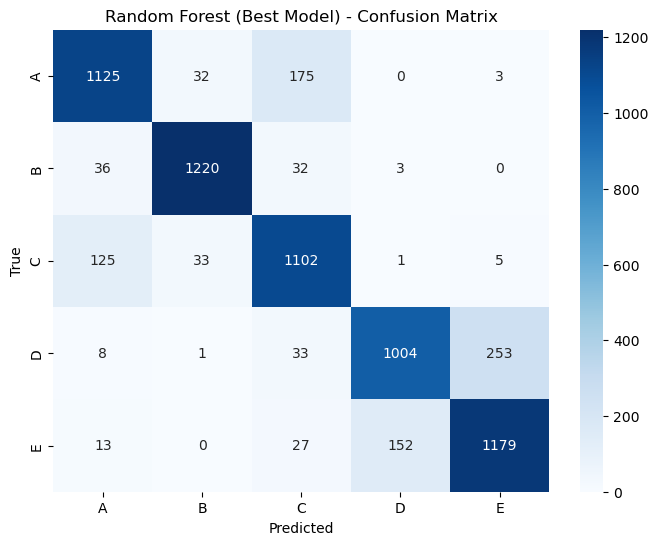

In [49]:
conf_matrix_rf_best = confusion_matrix(y_test, y_pred_test_rf_best)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf_best, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['A', 'B', 'C', 'D', 'E'], 
            yticklabels=['A', 'B', 'C', 'D', 'E'])
plt.title('Random Forest (Best Model) - Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

The confusion matrix visualizes the performance of the RF classifier. The diagonal elements represent correct predictions (e.g., 1125 ‘A’ labels were correctly predicted), while off-diagonal elements indicate misclassifications (e.g., 175 ‘A’ true labels were predicted as ‘C’), highlighting areas where the model might need improvement.